# Tree statistics

In [2]:
import os
import sys
from collections import defaultdict
from functools import partial
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas.errors import SettingWithCopyWarning
import numpy as np
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')

# from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import adjusted_mutual_info_score

from tqdm.notebook import tqdm 
from math import factorial, log, log10, log1p, floor, ceil

import multiprocess

sns.set()
sns.set_style("ticks")

# set dark plots if theme is dark
user_settings = os.path.expanduser('~/.jupyter/lab/user-settings/@jupyterlab/apputils-extension/themes.jupyterlab-settings')
if os.path.exists(user_settings) and 'JupyterLab Dark' in open(user_settings).read():
    style = {'axes.facecolor': '#111111',
     'axes.edgecolor': '.99',
     'axes.labelcolor': '.99',
     'figure.facecolor': '#111111',
     'grid.color': '.0',
     'text.color': '.99',
     'xtick.color': '.99',
     'ytick.color': '.99',
     'patch.edgecolor': 'w',
    }
    sns.set_style(style)
    sns.set_palette('pastel')

# sns.set(rc={'axes.facecolor':'#1E1E1E', 'figure.facecolor':'#1E1E1E'})

import tskit
import msprime

# scale down size of default plots
sns.set_context("paper")
import matplotlib as mpl
scale = 0.8
d = dict([(k, v*scale) for (k, v) in sns.plotting_context('paper').items()])
d['figure.figsize'] = [5.4, 3.5]
mpl.rcParams.update(d)

import geneinfo as gi
gi.email('kaspermunch@birc.au.dk')

def modpath(p, parent=None, base=None, suffix=None):
    par, name = os.path.split(p)
    name_no_suffix, suf = os.path.splitext(name)
    if type(suffix) is str:
        suf = suffix
    if parent is not None:
        par = parent
    if base is not None:
        name_no_suffix = base
    new_path = os.path.join(par, name_no_suffix + suf)
    if type(suffix) is tuple:
        assert len(suffix) == 2
        new_path, nsubs = re.subn(r'{}$'.format(suffix[0]), suffix[1], new_path)
        assert nsubs == 1, nsubs
    return new_path

## Fishers method for combining p-values

In [3]:
from scipy.stats import chi2
def fisher_method(pvalues):
    df = 2* len(pvalues)
    return 1-chi2.cdf(-2*sum(map(log, pvalues)), df)
    
p = fisher_method([1e-4, 1e-3])
-np.log10(p)

5.766544551240487

In [4]:
10**-3

0.001

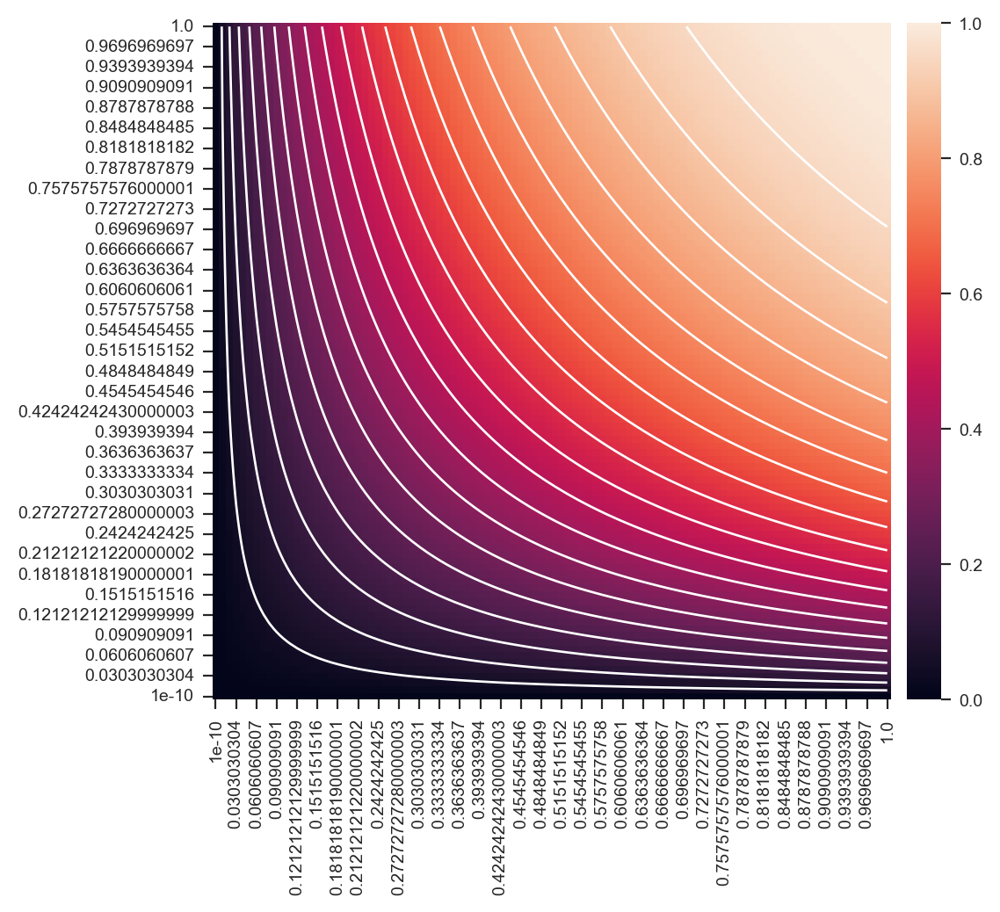

In [5]:
#https://en.wikipedia.org/wiki/Fisher%27s_method

from scipy.stats import chi2

def fisher_method(pvalues):
    df = 2* len(pvalues)
    return 1-chi2.cdf(-2*sum(map(log, pvalues)), df)
    
n = 100
x = np.linspace(1e-10, 1, n)
a = np.array(list(itertools.product(x, x)))
b = np.apply_along_axis(fisher_method, 1, a)
c = b.reshape(n, n)
data = pd.DataFrame(c)
data.index = x
data.columns = x

fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(data=data, cbar_kws={'pad': 0.02}, ax=ax)
ax.contour(np.arange(.5, data.shape[1]), np.arange(.5, data.shape[0]), data, levels=20, colors='white')
ax.invert_yaxis()

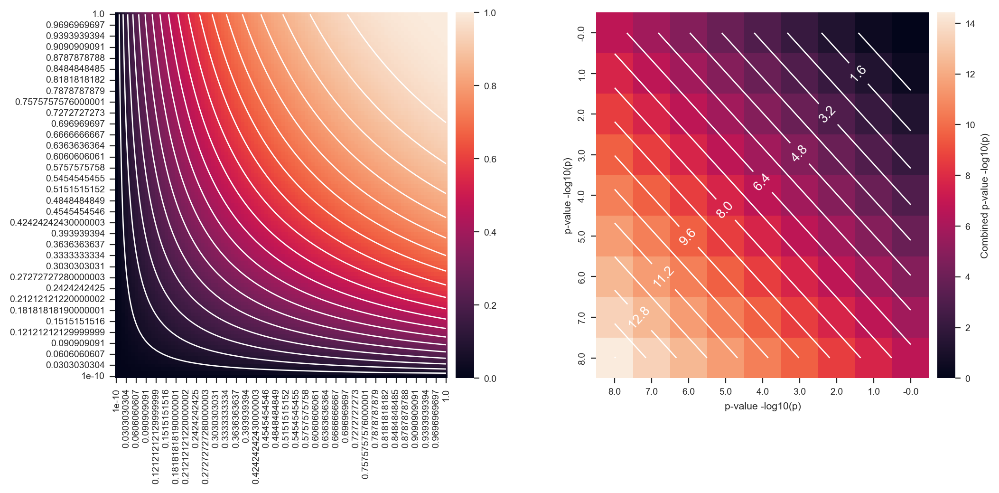

In [6]:
def fisher_method(pvalues):
    df = 2* len(pvalues)
    return 1-chi2.cdf(-2*sum(map(log, pvalues)), df)
    
n = 100
x = np.linspace(1e-10, 1, n)
a = np.array(list(itertools.product(x, x)))
b = np.apply_along_axis(fisher_method, 1, a)
c = b.reshape(n, n)
data = pd.DataFrame(c)
data.index = x
data.columns = x

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
sns.heatmap(data=data, cbar_kws={'pad': 0.02}, ax=ax1)
ax1.contour(np.arange(.5, data.shape[1]), np.arange(.5, data.shape[0]), data, levels=20, colors='white')
ax1.invert_yaxis()

def fisher_method_log10(pvalues):
    df = 2* len(pvalues)
    return -np.log10(1-chi2.cdf(-2*sum(map(log, pvalues)), df))
    # return 1-chi2.cdf(-2*sum(map(log, pvalues)), df)

pmin = -8
n = -pmin*1+1
# x = np.logspace(1e-10, 1, n)
x = np.logspace(-8, 0, n)
a = np.array(list(itertools.product(x, x)))
b = np.apply_along_axis(fisher_method_log10, 1, a)
c = b.reshape(n, n)
data = pd.DataFrame(c)
data.index = np.round(-np.log10(x), 1)
data.columns = np.round(-np.log10(x), 1)

sns.heatmap(data=data, cbar_kws={'pad': 0.02, 'label': 'Combined p-value -log10(p)'}, ax=ax2)
cs = ax2.contour(np.arange(.5, data.shape[1]), np.arange(.5, data.shape[0]), data, levels=20, colors='white')

def fmt(x):
    return np.round(x,2)

ax2.clabel(cs, cs.levels[::2], inline=True, fmt=fmt, fontsize=10)
ax2.invert_yaxis()
plt.xlabel('p-value -log10(p)')
plt.ylabel('p-value -log10(p)') ;

`comb` callable with cache:

In [7]:
# from scipy.special import comb
import scipy

class Comb():

    cache = {}
    
    def __init__(self):
        pass

    def __call__(self, n, k, exact=True):
        if (n, k) not in self.cache:
            self.cache[(n, k)] = scipy.special.comb(n, k, exact=exact)
        return self.cache[(n, k)]

    @classmethod
    def clear(cls):
        cls.cache = {}

    def __enter__(self):

        def init_worker(data):
            # declare scope of a new global variable
            global comb
            # store argument in the global variable for this process
            comb = data
            
        self.pool = multiprocess.Pool(processes=8, initializer=init_worker, initargs=(self,))
        return self.pool

    def __exit__(self, type, value, tb):
        self.pool.close()

Comb().clear()
comb = Comb()

with Comb() as pool:
    pass
# pool = comb.multiprocess_pool()
# pool.close()

## Combinatorial results and functions for run probabilities

In [8]:
def get_coalescence_runs(all_times, clade_times):
    clade_times_set = set(clade_times)
    k, fn = 1, 1
    coalescence_runs = []
    first_derived_coal_found = False
    for t in all_times:
        is_derived = int( t in clade_times_set)
        if first_derived_coal_found:
            coalescence_runs.append(is_derived)
        if is_derived:
            # get all the coalescences *after* the first derived one. So that the first can be both 0 and 1
            first_derived_coal_found = True
    return np.array(coalescence_runs)

def get_runs_of_1s(bits):
    for bit, group in itertools.groupby(bits):
        if bit:
            yield sum(group)

def get_all_runs(bits):
    for bit, group in itertools.groupby(bits):
        if bit:
            yield sum(group)
    bits = np.absolute(bits - 1)
    for bit, group in itertools.groupby(bits):
        if bit:
            yield sum(group)

### PDF of the number of runs of zeros and ones

If r is odd:

$\displaystyle p(r) = \frac{\binom{n_1-1}{k} \binom{n_2-1}{k-1} + \binom{n_1-1}{k-1} \binom{n_2-1}{k} }{ \binom{n_1+n_2}{n_1}}$

where $\displaystyle k = \frac{r-1}{2}$

If r is even:

$\displaystyle p(r) = \frac{2 \binom{n_1-1}{k} \binom{n_2-1}{k-1} }{ \binom{n_1+n_2}{n_1}}$

where $\displaystyle k = \frac{r}{2}$


Got it [here](http://www.statistics4u.com/fundstat_eng/ee_runs_test.html)

In [9]:
def prob_nr_of_runs(n, n1, n2):
    """
    Probability of the number runs of either zeros or ones
    n: number of runs
    n0: nr zeros
    n1: nr ones
    """
    if n % 2:
        # uneven
        k = (n - 1) //  2
        return (comb(n1-1, k)*comb(n2-1, k-1) + comb(n1-1, k-1)*comb(n2-1, k)) / comb(n1+n2, n1)
    else:
        # even
        k = n // 2
        return 2*comb(n1-1, k-1)*comb(n2-1, k-1) / comb(n1+n2, n1)    

### The PDF over the number of occurences of runs with given length

Distribution of the random variable $E_{n,k}$ denoting the number of success runs of a fixed length $k$, $1 \le k \le n$:

$\displaystyle P(E_{n,k} = x) = \sum^{n-kx}_{y=0} p^{n-y} q^y \binom{y+1}{x} \sum^{\lfloor \frac{n-y-kx}{k} \rfloor}_{j=0} (-1)^j \binom{y+1-x}{j} \binom{n-(k+1)(x+j)}{n-y-k(x+j)} $

From ["On success runs of a fixed length in Bernoulli sequences: Exact and asymptotic results"](https://doi.org/10.1016/j.camwa.2010.12.023)

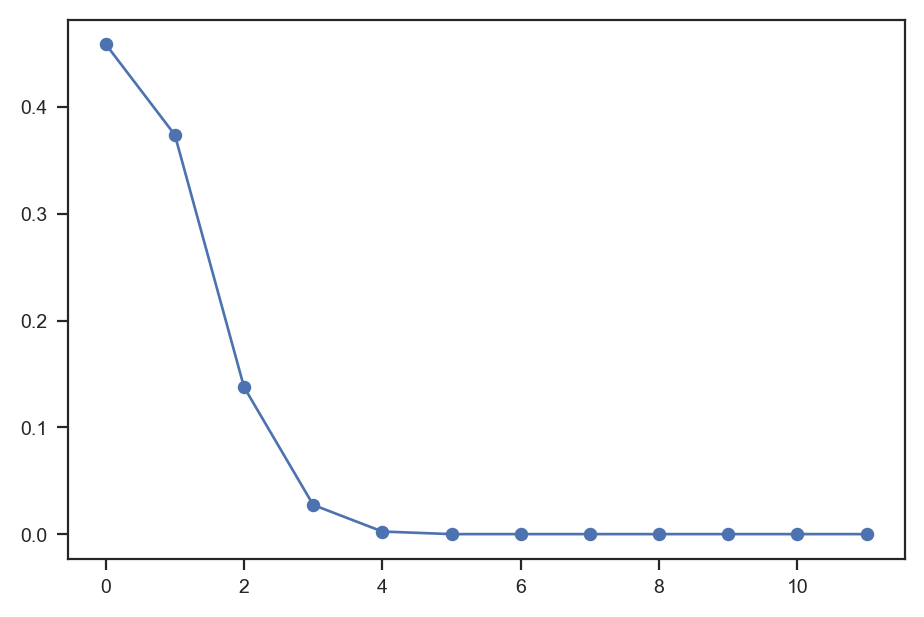

In [10]:
def pdf_number_of_1s_runs_with_len(n, k, p, x):
    q = 1-p
    prob = 0
    for y in range(0, (n-k*x)+1):
        prob += p**(n-y) * q**y * comb(y+1, x, exact=True) * sum(  (-1)**j * comb(y+1-x, j, exact=True) * comb(n-(k+1)*(x+j), n-y-k*(x+j), exact=True) for j in range(floor((n-y-k*x)/k)+1))
    return prob

n0, n1 = 4, 8
r = 2
x = list(range(n0+n1))
y = [pdf_number_of_1s_runs_with_len(n0+n1, r, n1/(n0+n1), n) for n in x]
plt.plot(x, y, 'o-');

### The the exact number and probability of a number of runs with a given length

The number of runs of a give length is:

$N^{i_k, k}_n = \displaystyle \sum^{n+1-(k+1)i_k}_{r=1} \binom{r+i_k}{i_k} \sum^{r}_{q=0} \sum^{q}_{j=0} (-1)^{q+j} \binom{r+m-1-kq-j}{m-kq-j} \binom{r}{q} \binom{q}{j} $

where $m = n+1-(k+1)i-r$.

The probability of occurrence of exactly $i_k$ runs of 1’s of length $k4$ in a given binary string of length $n$ is:

$ \displaystyle \frac{N^{i_k, k}_n}{2^n} $

From equation (3) in ["On the distribution of runs of ones in binary strings"](https://doi.org/10.1016/j.camwa.2009.07.057).

0.000244140625


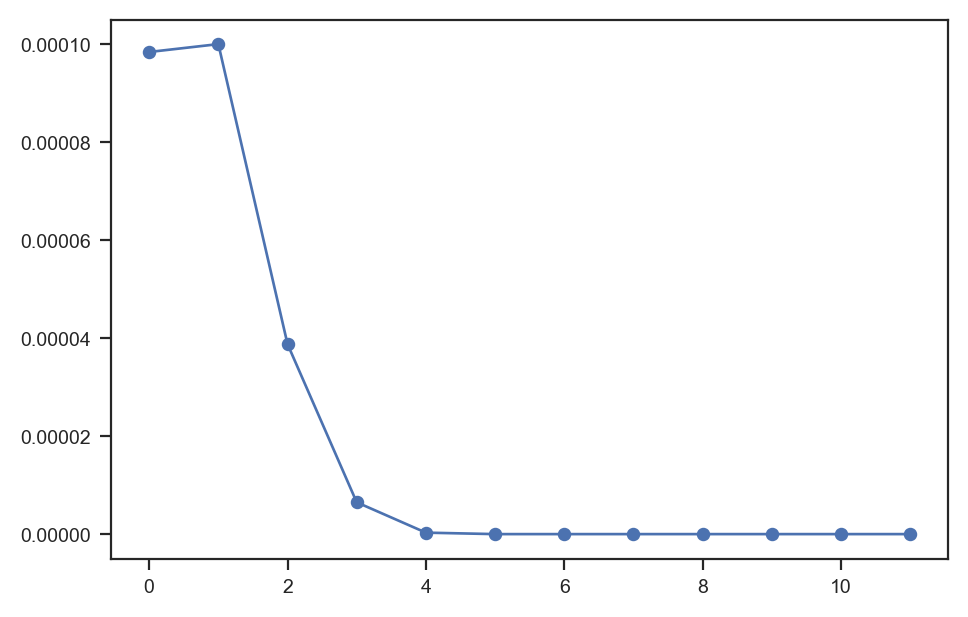

In [11]:
def nr_of_1s_runs_with_len(n, p, k, i):
    """
    The number of combinations with i runs of length k in a string of length n
    n: length
    p: probability of 1
    k: run length
    i: number of runs
    """    
    return sum( comb(r + i, i, exact=True) *
               sum(
                   sum( (-1)**(q + j) * comb(r + (n+1-(k+1)*i-r) - 1 - k*q - j, (n+1-(k+1)*i-r) - k*q - j, exact=True) * comb(r, q, exact=True) * comb(q, j, exact=True) \
                       for j in range(0, q+1))
                   for q in range(0, r+1))
               for r in range(1, (n+1-(k+1)*i)+1)) / 2**n

def prob_nr_of_1s_runs_with_len(n, p, k, i):
    """
    The probability of occurence of exactly i runs of 1's of length k in a string of length n
    n: length
    p: probability of 1
    k: run length
    i: number of runs
    """    
    return nr_of_1s_runs_with_len(n, p, k, i) / 2**n

#prob_nr_of_1s_runs_with_len(n=8, p=0.5, k=2, i=2)

n0, n1 = 4, 8
r = 2
x = list(range(n0+n1))
y = [prob_nr_of_1s_runs_with_len(n0+n1, n1/(n0+n1), r, n) for n in x]
print(sum(y))
plt.plot(x, y, 'o-');


### Probability of the longest run of ones

$P(L_n = k) = p^n \displaystyle \sum^{n-k}_{y=\lfloor n/k+1 \rfloor} (q/p)^y \sum^{y+1}_{i=1} \binom{y+1}{i}  C(n-y-ik, y+1-i, k-1)$

where

$\displaystyle C(\alpha, r, k) = \sum^r_{j=0} (-1)^j \binom{r}{j} \binom{a-(k+1)j + r - 1}{r-1} $

From equations (2) and (7) in ["Shortest and longest length of success runs in binary sequences"](https://doi:10.1016/j.jspi.2006.07.007).

0.9999799728916514


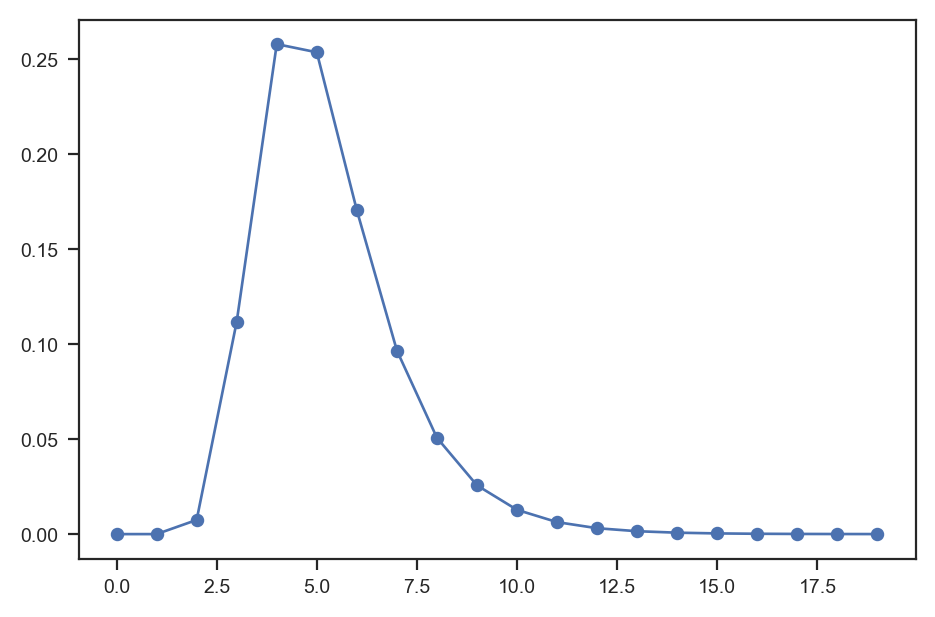

In [12]:
def prob_longest_1s_run(n, k, p):
    q = 1-p
    def C(a, r, k):
        return sum( (-1)**j * comb(r, j, exact=True) * comb(a - (k+1)*j + r - 1, r-1, exact=True) for j in range(0, r+1))
    return p**n * sum( (q/p)**y * sum( comb(y+1, i, exact=True) * C(n-y-i*k, y+1-i, k-1) for i in range(1, ((y+1)+1))) for y in range(floor(n/(k+1)), (n-k)+1) )


prob_longest_1s_run(10, 6, 0.5)

n0, n1 = 30, 30
r = 15
x = list(range(20))
y = [prob_longest_1s_run(n0+n1, r, n1/(n0+n1)) for r in x]
print(sum(y))
plt.plot(x, y, 'o-');

### Compute cached probabilities

Probability of longest run of derived:

In [14]:
pool = multiprocess.Pool(processes=8)

with multiprocess.Pool(processes=8) as pool:
    n = 100
    dim = 2*n+1
    cache = np.ndarray(shape=(n+1, n+1, 2*n+1), dtype=float)
    cache[:, :, :] = np.nan
    for n0 in tqdm(range(1, n+1)):
        for n1 in tqdm(range(1, n+1), leave=False):
    
            r_list = list(range(1, n0+n1+1))
            args = list(zip([n0+n1] * len(r_list), r_list, [n1/(n0+n1)]*len(r_list)))
            for p, r in zip(pool.starmap(prob_longest_1s_run, args), r_list):
                cache[n0, n1, r] = p
            
            # for r in range(1, n0+n1+1):
            #     cache[n0, n1, r] = prob_longest_1s_run(n0+n1, r, n1/(n0+n1))

np.save('prob_longest_der_run_cache.npy', cache)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Proability of the number of ancestral and derived runs:

In [15]:
%%time
pool = multiprocess.Pool(processes=8)

with multiprocess.Pool(processes=8) as pool:
    n = 100
    dim = 2*n+1
    cache = np.ndarray(shape=(n+1, n+1, 2*n+1), dtype=float)
    cache[:, :, :] = np.nan
    for n0 in tqdm(range(1, n+1)):
        for n1 in range(1, n+1):
            for r in range(1, n0+n1):
                cache[n0, n1, r] = prob_nr_of_runs(r, n0, n1)

np.save('prob_nr_of_runs_cache.npy', cache)

  0%|          | 0/100 [00:00<?, ?it/s]

CPU times: user 1.34 s, sys: 79 ms, total: 1.42 s
Wall time: 1.47 s


### Analyze pvalues

#### longest_1s_run

In [ ]:
pvalues = []
n = 100
for n1 in range(1, n+1):
    n0 = n - n1
    for _ in range(10):
        runs = np.array(([1] * n1) + ([0]*n0))
        np.random.shuffle(runs)
        nr_runs = np.fromiter(get_all_runs(runs), int).size
        pvalue = sum(prob_longest_1s_run(x, n0, n1) for x in range(1, nr_runs+1))
        # if pvalue == 1:
        #     print(nr_runs, len(runs), n0, n1)
        pvalues.append(pvalue)

plt.hist(pvalues, bins=200) ;

#### nr_runs

**So pvalues do seem to be uniform, except for the peak at 1...**

**Fix that and double check the way i get the runs from data**

In [ ]:
pvalues = []
n = 1000
for n1 in range(1, n+1):
    n0 = n - n1
    for _ in range(10):
        runs = np.array(([1] * n1) + ([0]*n0))
        np.random.shuffle(runs)
        nr_runs = np.fromiter(get_all_runs(runs), int).size
        pvalue = sum(prob_nr_of_runs(x, n0, n1) for x in range(1, nr_runs+1))
        # if pvalue == 1:
        #     print(nr_runs, len(runs), n0, n1)
        pvalues.append(pvalue)

plt.hist(pvalues, bins=200) ;

#### nr_runs

#### max_der_run

### Analyze data

In [34]:
prob_longest_der_run_cache = np.load('prob_longest_der_run_cache.npy')

# with np.printoptions(linewidth=100, precision=1, threshold=1000):
#     print(prob_longest_der_run_cache)

In [29]:
prob_nr_of_runs_cache = np.load('prob_nr_of_runs_cache.npy')

# with np.printoptions(linewidth=400, precision=1, threshold=1000):
#     print(prob_nr_of_runs_cache)

In [ ]:
# n = 100
# dim = 2*n+1
# cache = np.ndarray(shape=(n+1, n+1, 2*n+1), dtype=float)
# cache[:, :, :] = np.nan
# for n0 in tqdm(range(n+1)):
#     for n1 in range(1, n+1):
#         # print(np.nansum(prob_nr_of_runs_cache[n0, n1, :]))
#         print(prob_nr_of_runs_cache[n0, n1, 1:]))



In [32]:
for treeseq_file_name in [
                          '../data/chromhapX_tskit.trees',
                          '../data/Mikumi_relate_chromhapX.trees',
                          '../data/Tanzania_Olive_relate_chromhapX.trees',
                          '../data/Eastern_Yellow_relate_chromhapX.trees'
                         ]:
    print(treeseq_file_name)
    
    output_file_name = modpath(treeseq_file_name, parent='../results', suffix='_runstats.h5')
    
    tree_seq = tskit.load(treeseq_file_name)
    
    
    nr_samples = tree_seq.num_samples
    
    records = []
    nodes_time = tree_seq.nodes_time
    # for tree in tqdm(tree_seq.trees()):
    tree_idx = 0
    for tree in tqdm(tree_seq.trees()):
    
        N = tree.num_samples()
        all_times = [nodes_time[n] for n in tree.timedesc() if not tree.is_leaf(n)]
        for mut in tree.mutations():
            node = tree_seq.mutations_node[mut.id]
            clade_times = [nodes_time[n] for n in tree.timedesc(node) if not tree.is_leaf(n)]

            # nr-all-runs and max ones-run probabilities
            runs = get_coalescence_runs(all_times, clade_times)

            if len(runs) < nr_samples / 4:
                continue
            
            n1 = sum(runs)
            n0 = len(runs) - n1
            run_lengths = np.fromiter(get_all_runs(runs), int)
            runs_of_1s = list(get_runs_of_1s(runs))

            if len(runs_of_1s) == 0:
                # trippleton or smaller
                continue


            
            # # TODO: Filter on der and/or anc allele freq

            # if n1/(n0+n1) < 10:
            #     continue
            

            
            max_ones_run_len = max(runs_of_1s)
            nr_runs = run_lengths.size

            
            pvalue_max_der_run = np.nan
            # if sum(runs) < 2 or sum(runs) == len(runs) or max_ones_run_len == 1:
            #     pvalue_max_der_run = np.nan
            # else:
            #     try:
            #         pvalue_max_der_run = prob_longest_der_run_cache[n0, n1, max_ones_run_len:(n0+n1)].sum()
            #     except IndexError:
            #         pvalue_max_der_run = sum(prob_longest_1s_run(n0+n1, x, n1/(n0+n1)) for x in range(max_ones_run_len, n0+n1))

            
            if nr_runs == 1 or len(runs) <= 2 or nr_runs == len(runs):
                pvalue_nr_runs = np.nan
            else:
                try:
                    pvalue_nr_runs = prob_nr_of_runs_cache[n0, n1, 1:(nr_runs+1)].sum()
                except IndexError:
                    pvalue_nr_runs = sum(prob_nr_of_runs(x, n0, n1) for x in range(1, nr_runs+1))
            
            interval = tree.interval
            num_mutations = tree.num_mutations

            clade_left, clade_right = interval.left, interval.right

            assert clade_times
            
            records.append(['max_der_run',
                            mut.site, 
                            pvalue_max_der_run,
                            max_ones_run_len,
                            len(runs),
                            clade_times[0], 
                            0,
                            interval.left,
                            interval.right,
                            clade_left, 
                            clade_right,
                            num_mutations])

            records.append(['nr_runs',
                            mut.site, 
                            pvalue_nr_runs,
                            nr_runs,
                            len(runs),                            
                            clade_times[0], 
                            0,
                            interval.left,
                            interval.right,
                            clade_left, 
                            clade_right,
                            num_mutations])
    
    
        tree_idx += 1
    
    
    df = pd.DataFrame.from_records(records, columns=['stat_name', 'site', 'p', 'stat', 'nr_coal', 't1', 't2', 
                                                     'tree_left', 'tree_right', 'clade_left', 'clade_right', 
                                                     'nr_mut'])
    df['pos'] = tree_seq.sites_position[df.site]
    df.to_hdf(output_file_name, 'df', format='table')
    

../data/chromhapX_tskit.trees


FileNotFoundError: [Errno 2] No such file or directory: '../data/chromhapX_tskit.trees'

In [ ]:
# df = pd.read_hdf('../results/Eastern_Yellow_relate_chromhapX_runstats.h5')
# df = pd.read_hdf('../results/Mikumi_relate_chromhapX_runstats.h5')
# df = pd.read_hdf('../results/Tanzania_Olive_relate_chromhapX_runstats.h5')
df = pd.read_hdf('../results/chromhapX_tskit_runstats.h5')
df.head()

In [ ]:
plot_df = df.loc[df.stat_name == 'max_der_run']
plot_df['-log10p'] = -np.log10(plot_df.p)

import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=plot_df, x='pos', y='-log10p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    # ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
    sns.despine()
    # plt.xlim((60000000, 65000000))
    # plt.ylim((0, 6))

In [ ]:
# plot_df = df.copy().loc[(df.stat_name == 'nr_runs') & (df.nr_coal > 10)]
# plot_df['-log10p'] = -np.log10(plot_df.p)
# plot_df = plot_df[['pos', '-log10p']].rolling(10).mean()

# #plot_df['-log10p'] = -np.log10(plot_df.p)


# import warnings
# with warnings.catch_warnings():
#     warnings.simplefilter(action='ignore', category=FutureWarning)
    
#     fig, ax = plt.subplots(1, 1, figsize=(15,4))
#     sns.scatterplot(data=plot_df, x='pos', y='-log10p', ax=ax, linewidth=0, s=5, palette='viridis') ;
#     ax.set_xticks(np.arange(0, max(df.pos)+1, 5000000))
#     # ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
#     # ax.axhline(-np.log10(0.001), color='red', linestyle='dashed') ;
#     sns.despine()
#     # plt.xlim((60000000, 65000000))
#     # plt.ylim((0, 6))

In [ ]:
# plot_df = df.copy().loc[(df.stat_name == 'nr_runs') & (df.nr_coal > 25)]
# plot_df['-log10p'] = -np.log10(plot_df.p)

# import warnings
# with warnings.catch_warnings():
#     warnings.simplefilter(action='ignore', category=FutureWarning)
    
#     fig, ax = plt.subplots(1, 1, figsize=(15,4))
#     sns.scatterplot(data=plot_df, x='pos', y='-log10p', hue='stat', ax=ax, linewidth=0, s=15, palette='viridis') ;
#     ax.set_xticks(np.arange(0, max(df.pos)+1, 5000000))
#     # ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
#     # ax.axhline(-np.log10(0.001), color='red', linestyle='dashed') ;
#     sns.despine()
#     # plt.xlim((60000000, 65000000))
#     # plt.ylim((0, 6))

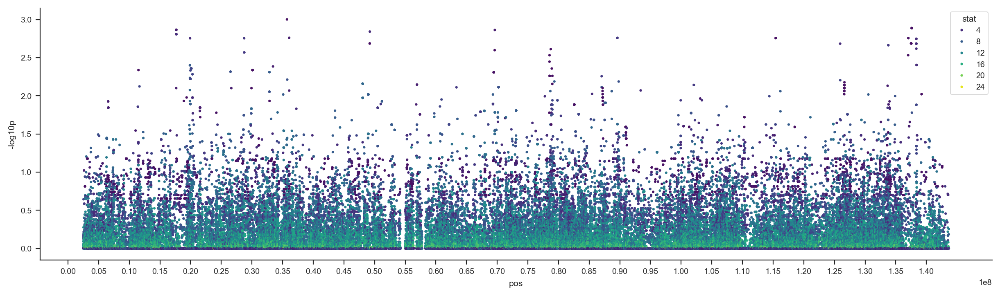

In [144]:
plot_df = df.copy().loc[df.stat_name == 'nr_runs']
plot_df['-log10p'] = -np.log10(plot_df.p)

import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=plot_df, x='pos', y='-log10p', hue='stat', ax=ax, linewidth=0, s=5, palette='viridis') ;
    ax.set_xticks(np.arange(0, max(df.pos)+1, 5000000))
    # ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
    # ax.axhline(-np.log10(0.001), color='red', linestyle='dashed') ;
    sns.despine()
    # plt.xlim((60000000, 65000000))
    # plt.ylim((0, 6))

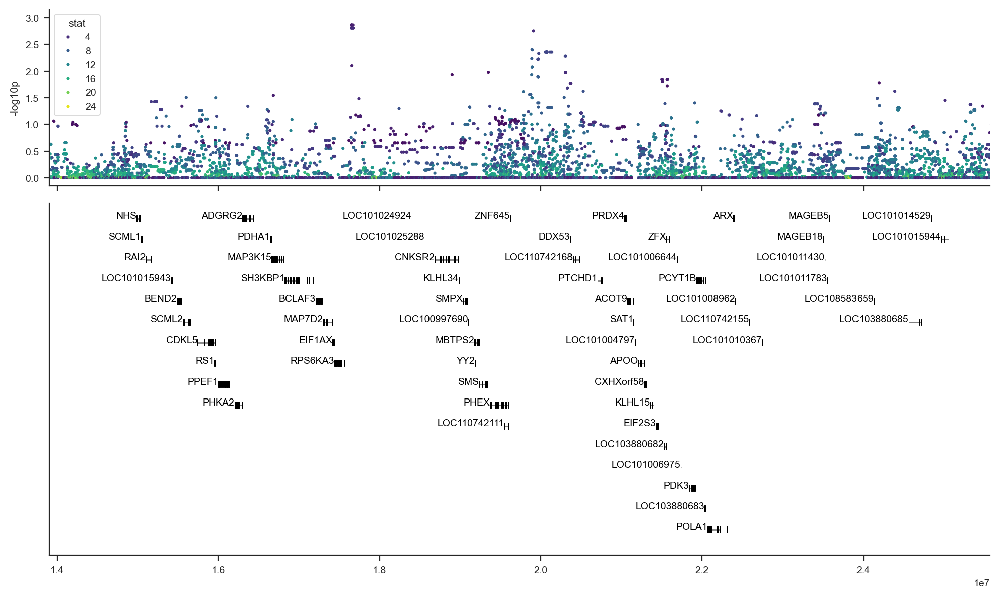

In [148]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 15_000_000, 25_000_000, 'papAnu4', figsize=(10,6), aspect=2)
    sns.scatterplot(data=plot_df, x='pos', y='-log10p', hue='stat', ax=ax, linewidth=0, s=5, palette='viridis') ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    # ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

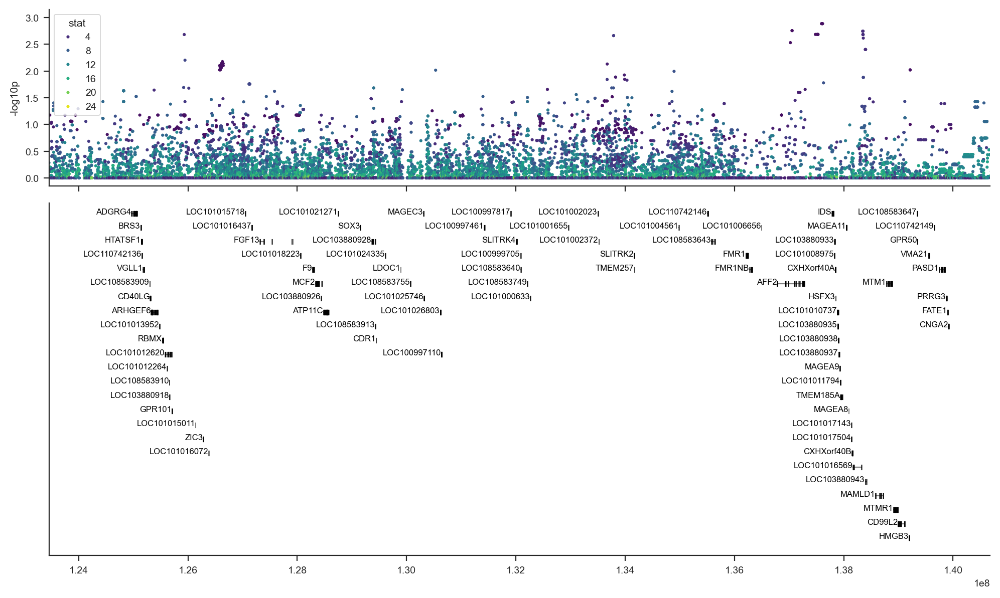

In [152]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 125_000_000, 140_000_000, 'papAnu4', figsize=(10,6), aspect=2)
    sns.scatterplot(data=plot_df, x='pos', y='-log10p', hue='stat', ax=ax, linewidth=0, s=5, palette='viridis') ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    # ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

## Modified Relate stat

In [33]:
def prob_descendants(s, k, fn, N):
    return comb(fn-1, s-1)*comb(N-fn-1, k-s-1)/comb(N-1, k-1)

def pos_p_val(s, k, fn, N):
    p = sum(prob_descendants(s, k, f, N) for f in range(fn, N-k+s  +1 ))
    assert 1.00000001 >= p >= 0, (p, s, k, fn, N)
    return p

def neg_p_val(s, k, fn, N):
    s, k, fn, N = k-s, k, N-fn, N
    p = sum(prob_descendants(s, k, f, N) for f in range(fn, N-k+s  +1 ))
    assert 1.00000001 >= p >= 0, (p, s, k, fn, N)
    return p


def comb_p_val(s, k, fx, kx, fn, N):
    p_value = 0
    for f1 in range(fx, kx-k+s +1):
        a = prob_descendants(s, k, f1, kx)
        for f2 in range(fn, N-k+s  +1 ):
            b = prob_descendants(kx-fx, kx, N-f2, N)
            p_value += a * b
    return p_value


def get_intermediate_states(all_times, clade_times):
    clade_times_set = set(clade_times)
    k, fn = 1, 1
    intermediate_states = []
    for t in all_times:
        k += 1
        if t in clade_times_set:
            fn += 1
            if fn >= 2:
                intermediate_states.append((fn, k))
    return intermediate_states

def pvalues(k, fn, N, intermediate_states):
    p_values = []
    for i, (fx, kx) in enumerate(intermediate_states):
        pos_p = pos_p_val(2, k, fx, kx)
        assert kx <= N, (kx, N)
        neg_p = neg_p_val(fx, kx, fn, N)
        # p_values.append((pos_p, neg_p))
        comb_p = comb_p_val(2, k, fx, kx, fn, N)
        p_values.append((pos_p, neg_p, comb_p))
    return p_values

### Analyze data

In [168]:
# treeseq_file_name = '../data/chromhapX_tskit.trees'
# treeseq_file_name = '/Users/kmt/google_drive/projects/switch-probs/chromX_tskit.trees'
# treeseq_file_name = '../data/Eastern_Yellow_relate_chromhapX.trees'
# treeseq_file_name = '../data/Mikumi_relate_chromhapX.trees'
# treeseq_file_name = '../data/Tanzania_Olive_relate_chromhapX.trees'

def sim_tree_sequence(nr_samples, L=1_000_000, rho=1e-8, mu=1e-8, 
                      # n_subpops=1, 
                      # subpop_size=3e4, 
                      # migration_rate=1e-4
                     ):

    demography = msprime.Demography()
    demography.add_population(name="pop_1", initial_size=30000)
    samples={'pop_1': nr_samples}
    
    ts_no_mut = msprime.sim_ancestry(
        samples=nr_samples,
        demography=demography,
        # samples={f"pop_{i}": 100 for i in range(n_subpops)},  # 10 samples from each subpop
        # demography=msprime.Demography.island_model([subpop_size] * n_subpops, migration_rate),
        ploidy=1,
        recombination_rate=rho,
        sequence_length=L,
        # random_seed=123,
    )
    ts_mutated = msprime.sim_mutations(ts_no_mut, rate=mu, 
                                       # random_seed=456
                                      )
    return ts_mutated


# # initialize worker processes
# def init_worker(data):
#     # declare scope of a new global variable
#     global comb
#     # store argument in the global variable for this process
#     comb = data
    
# pool = multiprocess.Pool(processes=8, initializer=init_worker, initargs=(comb,))

with Comb() as pool:

    for treeseq_file_name in ['../data/chromhapX_tskit.trees',
                              '../data/Mikumi_relate_chromhapX.trees',
                              '../data/Tanzania_Olive_relate_chromhapX.trees',
                              '../data/Eastern_Yellow_relate_chromhapX.trees'
                             ]:
        print(treeseq_file_name)
        
        output_file_name = modpath(treeseq_file_name, parent='../results', suffix='.h5')
        
        tree_seq = tskit.load(treeseq_file_name)
        
    
    
        nr_samples = tree_seq.num_samples
        
    
        
        # tree_seq = sim_tree_sequence()
        # tree_seq
    
        ####################################################################
    
        def fun(_):
    
            pos_data = defaultdict(list)
            neg_data = defaultdict(list)
            comb_data = defaultdict(list)
            
            sim_tree_seq = sim_tree_sequence(nr_samples)
            nodes_time = sim_tree_seq.nodes_time
            for tree_idx, tree in enumerate(sim_tree_seq.trees()):
                N = tree.num_samples()
                all_times = [nodes_time[n] for n in tree.timedesc() if not tree.is_leaf(n)]
                p_values = []
                for mut in tree.mutations():
                    node = sim_tree_seq.mutations_node[mut.id]
                    
                    clade_times = [nodes_time[n] for n in tree.timedesc(node) if not tree.is_leaf(n)]
                    intermediate_states = get_intermediate_states(all_times, clade_times)
                            
                    if len(intermediate_states) <= 2:
                        continue            
                    two, k = intermediate_states.pop(0)
                    assert two == 2
                    fn, N = intermediate_states[-1]
                    p_values = pvalues(k, fn, N, intermediate_states)
    
                if p_values:
                    # pos_p_values, neg_p_values, comb_p_values = zip(*p_values)
                    pos_p_values, neg_p_values, comb_p_values = zip(*p_values)
                    pos_data[k].append(pos_p_values)
                    neg_data[k].append(neg_p_values)
                    comb_data[k].append(comb_p_values)
            return pos_data, neg_data, comb_data
    
    
        pos_data = defaultdict(list)
        neg_data = defaultdict(list)
        comb_data = defaultdict(list)    
    
        for data in tqdm(pool.imap(fun, list(range(100))), total=100):
        # for data in tqdm(map(fun, range(100))):        
            
            _pos_data, _neg_data, _comb_data = data
            
            for key in _pos_data:
                pos_data[key].extend(_pos_data[key])
            for key in _neg_data:
                neg_data[key].extend(_neg_data[key])                
            for key in _comb_data:
                comb_data[key].extend(_comb_data[key])


        ####################################################################
        # # data = defaultdict(dict)
        # pos_data = defaultdict(list)
        # neg_data = defaultdict(list)
        # comb_data = defaultdict(list)
    
    
        # for _ in tqdm(range(100)):
        #     sim_tree_seq = sim_tree_sequence(nr_samples)
        #     nodes_time = sim_tree_seq.nodes_time
        #     for tree_idx, tree in enumerate(sim_tree_seq.trees()):
        #         N = tree.num_samples()
        #         all_times = [nodes_time[n] for n in tree.timedesc() if not tree.is_leaf(n)]
        #         p_values = []
        #         for mut in tree.mutations():
        #             node = sim_tree_seq.mutations_node[mut.id]
                    
        #             clade_times = [nodes_time[n] for n in tree.timedesc(node) if not tree.is_leaf(n)]
        #             intermediate_states = get_intermediate_states(all_times, clade_times)
                            
        #             if len(intermediate_states) <= 2:
        #                 continue            
        #             two, k = intermediate_states.pop(0)
        #             assert two == 2
        #             fn, N = intermediate_states[-1]
        #             p_values = pvalues(k, fn, intermediate_states)
        
        #         if p_values:
        #             # pos_p_values, neg_p_values, comb_p_values = zip(*p_values)
        #             pos_p_values, neg_p_values, comb_p_values = zip(*p_values)
        #             pos_data[k].append(pos_p_values)
        #             neg_data[k].append(neg_p_values)
        #             comb_data[k].append(comb_p_values)
        
        #         # for i, (a, b, c) in enumerate(p_values):
        #         #     if i not in pos_data[k]:
        #         #         pos_data[k][i] = []
        #         #     pos_data[k][i].append(a)                
        #         #     if i not in neg_data[k]:
        #         #         neg_data[k][i] = []
        #         #     neg_data[k][i].append(b)
    
            ####################################################################
    
        
        #samples = tree_seq.num_samples
        pos_corrections = {}
        neg_corrections = {}
        comb_corrections = {}
        
        bins = np.linspace(0, 1, 1000)    # CHANGE BACK TO 1000
        for k in range(3, nr_samples):
            c = 1
            for i in range(nr_samples-k):
                a, b = [], []
                for x in pos_data[k]:
                    if len(x) > i+1:
                        a.append(x[i])
                        b.append(x[i+1])
                # c += 1 - normalized_mutual_info_score(np.digitize(a, bins), np.digitize(b, bins))
                c += 1 - adjusted_mutual_info_score(np.digitize(a, bins), np.digitize(b, bins))                
                # print('pos', k, i, c)
                pos_corrections[(k, i+1)] = c    
            
        
            c = 1
            for i in range(nr_samples-k):
                a, b = [], []
                for x in neg_data[k]:
                    if len(x) > i+1:
                        a.append(x[i])
                        b.append(x[i+1])
                # c += 1 - normalized_mutual_info_score(np.digitize(a, bins), np.digitize(b, bins))
                c += 1 - adjusted_mutual_info_score(np.digitize(a, bins), np.digitize(b, bins))
                # print('neg', k, i, c)
                neg_corrections[(k, i+1)] = c
        
            c = 1
            for i in range(nr_samples-k):
                a, b = [], []
                for x in comb_data[k]:
                    if len(x) > i+1:
                        a.append(x[i])
                        b.append(x[i+1])
                # c += 1 - normalized_mutual_info_score(np.digitize(a, bins), np.digitize(b, bins))
                c += 1 - adjusted_mutual_info_score(np.digitize(a, bins), np.digitize(b, bins))                
                # print('comb', k, i, c)
                comb_corrections[(k, i+1)] = c
    
        
    
        
        records = []
        nodes_time = tree_seq.nodes_time
        # for tree in tqdm(tree_seq.trees()):
        tree_idx = 0
        for tree in tqdm(tree_seq.trees()):
        
            N = tree.num_samples()
            all_times = [nodes_time[n] for n in tree.timedesc() if not tree.is_leaf(n)]
            for mut in tree.mutations():
                node = tree_seq.mutations_node[mut.id]
                clade_times = [nodes_time[n] for n in tree.timedesc(node) if not tree.is_leaf(n)]
    
                # modified relate stat
                
                intermediate_states = get_intermediate_states(all_times, clade_times)
        
                if len(intermediate_states) < 4:
                    continue
                    
                two, k = intermediate_states.pop(0)
                assert two == 2
                if k == 2:
                    continue
        
                # fn, N = intermediate_states[-1]
                fn, N = intermediate_states.pop() # TODO: check this is correct
        
                if fn / N < 0.2:
                    continue
        
                p_values = pvalues(k, fn, N, intermediate_states)
                nr_inter = len(intermediate_states)
                
                interval = tree.interval
                num_mutations = tree.num_mutations
        
    
                clade_left, clade_right = interval.left, interval.right
                # shift = 1
                # while tree_idx-shift > 0 and node in tree_seq.at_index(tree_idx-shift).nodes():
                #     clade_left = tree.interval.left
                #     shift += 1 
                # shift = 1
                # while tree_idx+shift < tree_seq.num_trees and node in tree_seq.at_index(tree_idx+shift).nodes():
                #     clade_right = tree.interval.right
                #     shift += 1 
                
                
                p_p, n_p, c_p = zip(*p_values)
        
                idx = p_p.index(min(p_p))
                records.append(['pos',
                                mut.site, 
                                max(0.0, -log10((p_values[idx][0])*pos_corrections[(k, nr_inter)])), 
                                clade_times[0], 
                                clade_times[idx],
                                two,
                                k,
                                intermediate_states[idx][0],
                                intermediate_states[idx][1],
                                fn,
                                N,
                                interval.left,
                                interval.right,
                                clade_left, 
                                clade_right,
                                num_mutations, 
                                node])
                idx = n_p.index(min(n_p))
                records.append(['neg',
                                mut.site, 
                                max(0.0, -log10((p_values[idx][1])*neg_corrections[(k, nr_inter)])), 
                                clade_times[0], 
                                clade_times[idx],
                                two,
                                k,
                                intermediate_states[idx][0],
                                intermediate_states[idx][1],
                                fn,
                                N,
                                interval.left,
                                interval.right,
                                clade_left, 
                                clade_right,
                                num_mutations, 
                                node])
                c_idx = c_p.index(min(c_p))        
                records.append(['comb',
                                mut.site, 
                                max(0.0, -log10((p_values[idx][2])*comb_corrections[(k, nr_inter)])), 
                                clade_times[0], 
                                clade_times[idx],
                                two,
                                k,
                                intermediate_states[idx][0],
                                intermediate_states[idx][1],
                                fn,
                                N,
                                interval.left,
                                interval.right,
                                clade_left, 
                                clade_right,
                                num_mutations, 
                                node])        
        
        
            # if interval.right > 3_500_000:
            #     break
        
            tree_idx += 1
        
        
        df = pd.DataFrame.from_records(records, columns=['stat', 'site', 'p', 't1', 't2', 's', 'k', 'fx', 'kx', 'fn', 'N', 
                                                         'tree_left', 'tree_right', 'clade_left', 'clade_right', 
                                                         # 'nr_runs', 'prob_nr_runs', 'max_ones_run_len', 'prob_max_der_run',
                                                         'nr_mut', 'node_id'])
        df['pos'] = tree_seq.sites_position[df.site]
        df.to_hdf(output_file_name, 'df')


../data/chromhapX_tskit.trees


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/20175 [00:00<?, ?it/s]

../data/Mikumi_relate_chromhapX.trees


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/44187 [00:00<?, ?it/s]

Process ForkPoolWorker-127:
Process ForkPoolWorker-122:
Process ForkPoolWorker-129:
Process ForkPoolWorker-125:
Process ForkPoolWorker-126:
Process ForkPoolWorker-124:


KeyboardInterrupt: 

Process ForkPoolWorker-123:
Process ForkPoolWorker-128:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/multiprocess/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/multiprocess/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/multiprocess/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/multiprocess/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/multiprocess/process.py", lin

In [209]:
tree_seq = tskit.load('../data/chromhapX_tskit.trees')
0.05 / tree_seq.nodes_time.size

7.74433772747056e-08

In [210]:
df = ethiopia_live_scan = pd.read_hdf('../results/chromhapX_tskit.h5').loc[lambda df: df.stat == 'comb']
0.05 / df.node_id.unique().size

1.0767739851405191e-06

In [199]:
df.index.size

113120

In [200]:
df[['stat', 'node_id']].drop_duplicates()#.index.size

,stat,node_id
2,comb,92
5,comb,89
11,comb,90
20,comb,126
32,comb,121
...,...,...
339347,comb,645556
339350,comb,645558
339353,comb,645599
339356,comb,645625


In [201]:
m = df.groupby(['stat', 'node_id']).size()
m#.mean()

stat  node_id
comb  89         2
      90         2
      92         2
      121        2
      126        4
                ..
      645558     1
      645567     1
      645599     1
      645625     1
      645631     1
Length: 46435, dtype: int64

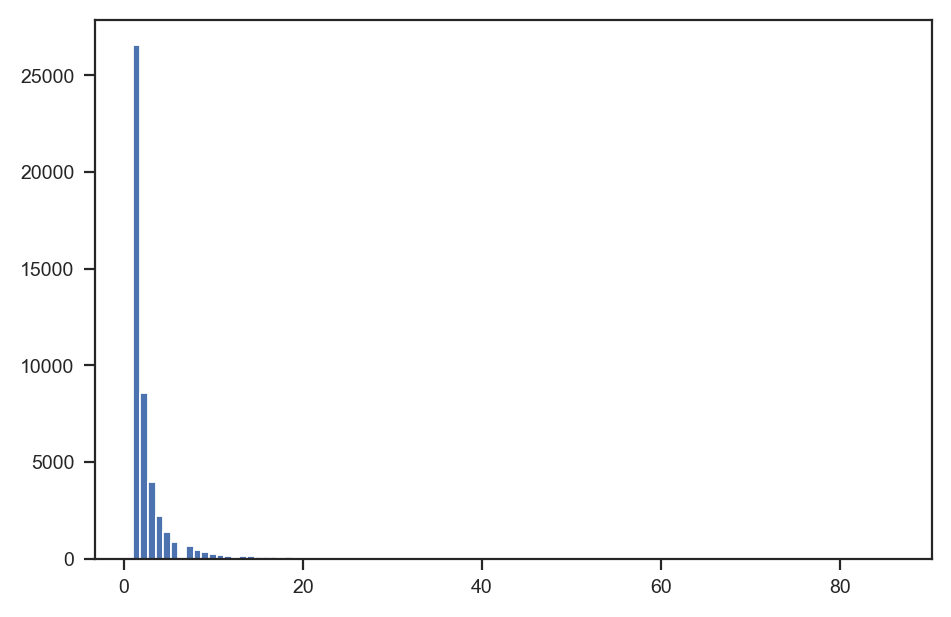

In [202]:
plt.hist(m, bins=100) ;

In [113]:
eastern_yellow_scan = pd.read_hdf('../results/Eastern_Yellow_relate_chromhapX.h5')
mikumi_scan = pd.read_hdf('../results/Mikumi_relate_chromhapX.h5')
tanzania_olive_scan = pd.read_hdf('../results/Tanzania_Olive_relate_chromhapX.h5')
ethiopia_live_scan = pd.read_hdf('../results/chromhapX_tskit.h5')

### idea

- add derived node ids to intermediate_states
- move through flanking trees
- see how many nodes are retained
- for each node (both derived and ancestral) not retained, compute the binomial prob of sampling derived and ancestral across the coalescence interval where it dissappears.
- continue to the next falking trees with the nodes that remain (if an internal node dissappears, all its descendants are removed)
- continue untill no nodes remain.

### TODO:

- add the pos and neg results to the t1-t2 plots with vertical connencing lines in corresponding colors
- Fix p-values for longest run
- Add parallel run of trees in data analysis and remember to sort trees at the end if need be

In [114]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

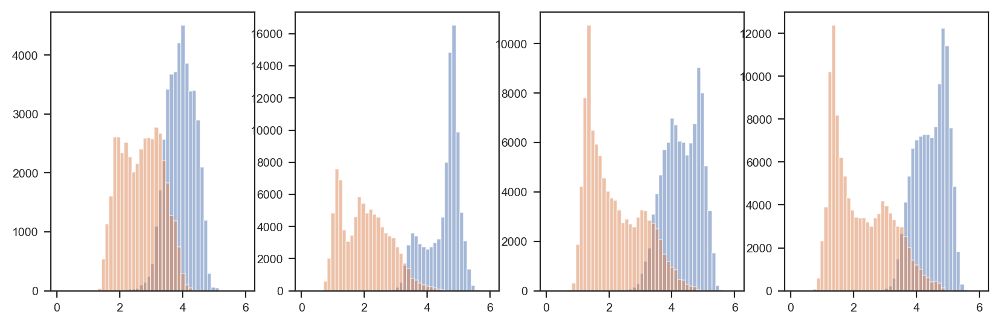

In [115]:
fig, ax = plt.subplots(1, 4, figsize=(10,3))
for i, df in enumerate([ethiopia_live_scan, tanzania_olive_scan, mikumi_scan, eastern_yellow_scan]):
    plot_df = df.loc[(df.stat == 'pos') & (df.p > 0)]
    ax[i].hist(np.log10(plot_df.t1), bins=np.linspace(0.1, 6, 50), alpha=0.5)
    ax[i].hist(np.log10(plot_df.t2), bins=np.linspace(0.1, 6, 50), alpha=0.5)

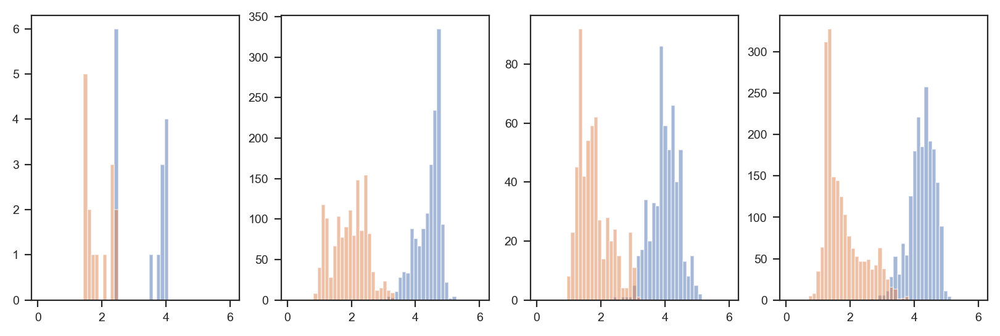

In [116]:
fig, ax = plt.subplots(1, 4, figsize=(10,3))
for i, df in enumerate([ethiopia_live_scan, tanzania_olive_scan, mikumi_scan, eastern_yellow_scan]):
    plot_df = df.loc[(df.stat == 'pos') & (df.p > 3)]
    ax[i].hist(np.log10(plot_df.t1), bins=np.linspace(0.1, 6, 50), alpha=0.5)
    ax[i].hist(np.log10(plot_df.t2), bins=np.linspace(0.1, 6, 50), alpha=0.5)

In [117]:
df = ethiopia_live_scan

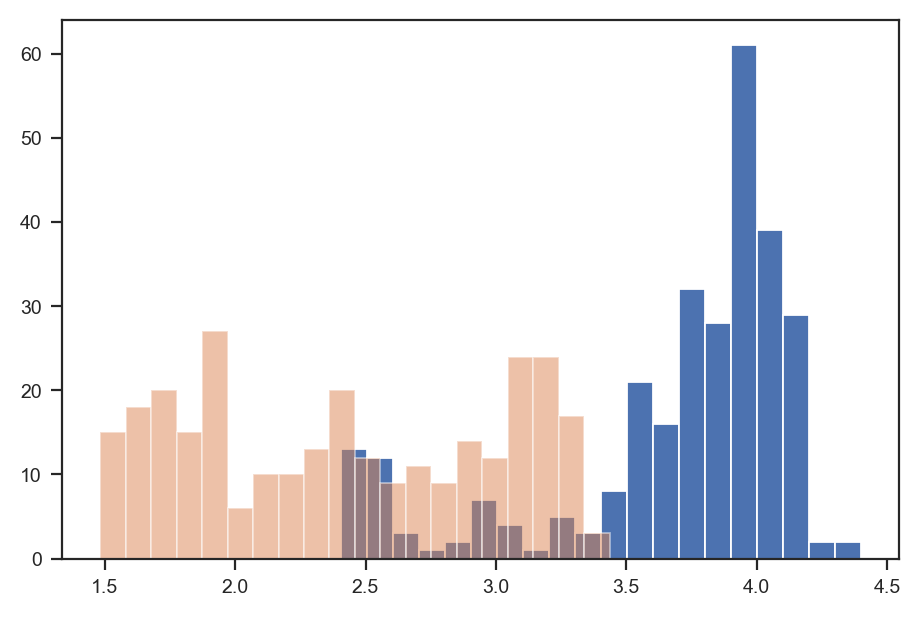

In [118]:
plt.hist(np.log10(df.loc[(df.stat == 'pos') & (df.p > 2)].t1), bins=20) ;
plt.hist(np.log10(df.loc[(df.stat == 'pos') & (df.p > 2)].t2), bins=20, alpha=0.5) ;

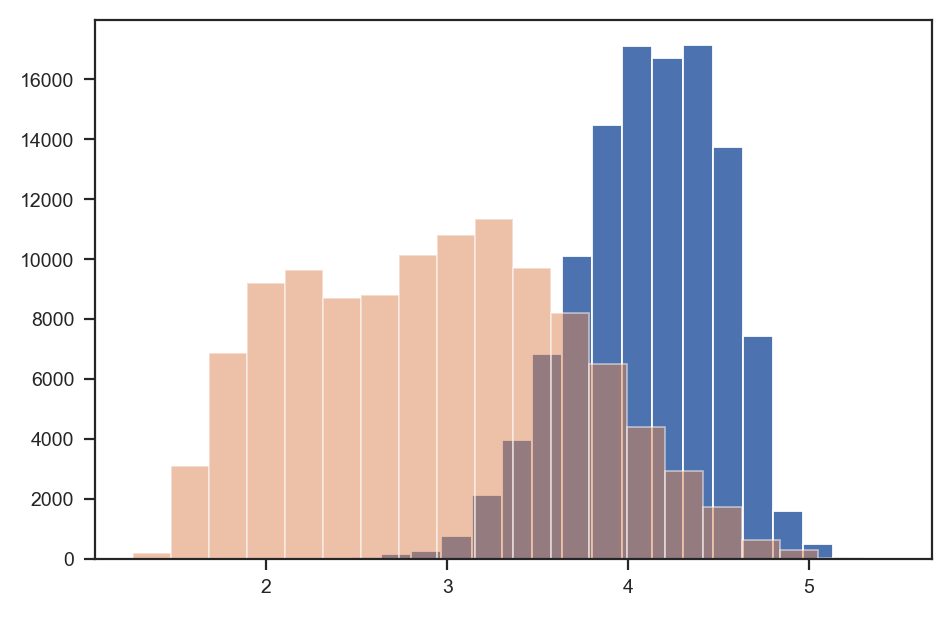

In [119]:
plt.hist(np.log10(df.loc[df.stat == 'pos'].t1), bins=20) ;
plt.hist(np.log10(df.loc[df.stat == 'pos'].t2), bins=20, alpha=0.5) ;

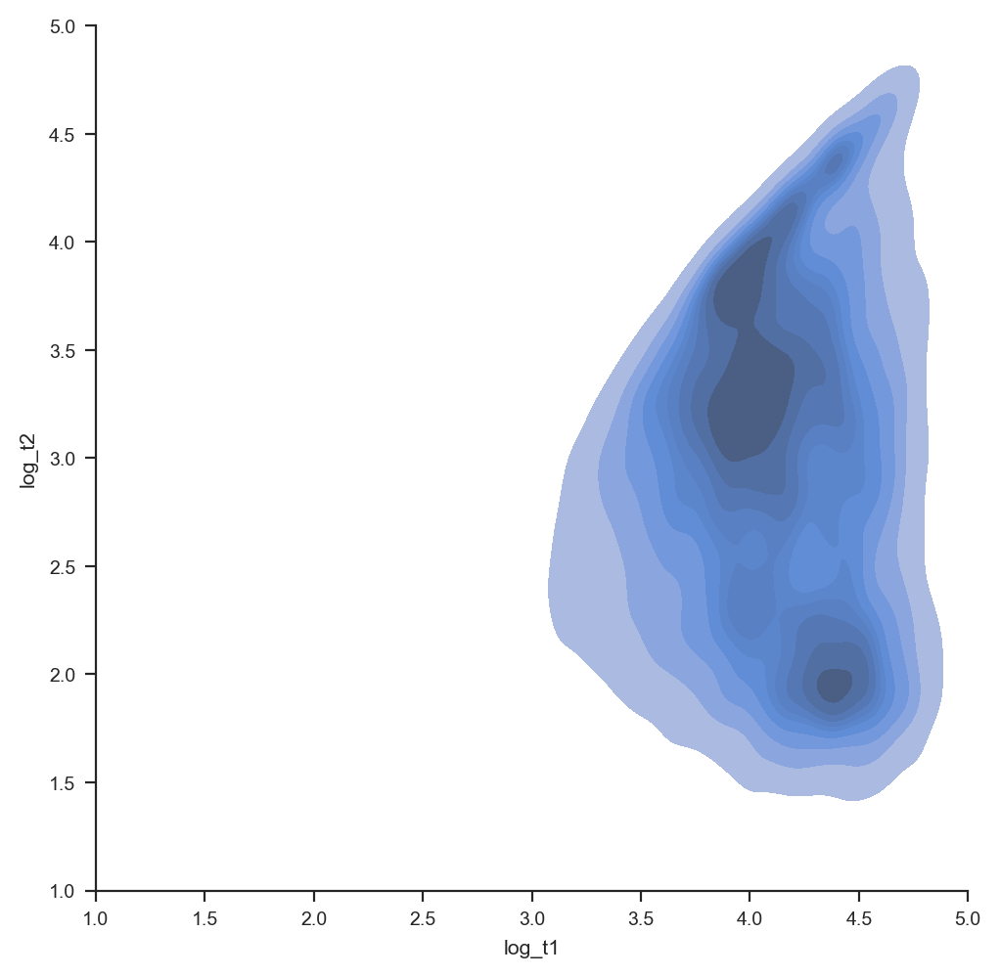

In [120]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=(FutureWarning, SettingWithCopyWarning))

    plot_df = df.loc[df.stat == 'pos']
    plot_df['log_t1'] = np.log10(plot_df.t1)
    plot_df['log_t2'] = np.log10(plot_df.t2)
    sns.displot(data=plot_df, x="log_t1", y="log_t2", kind='kde', fill=True) ;
    plt.xlim(1, 5)
    plt.ylim(1, 5)    

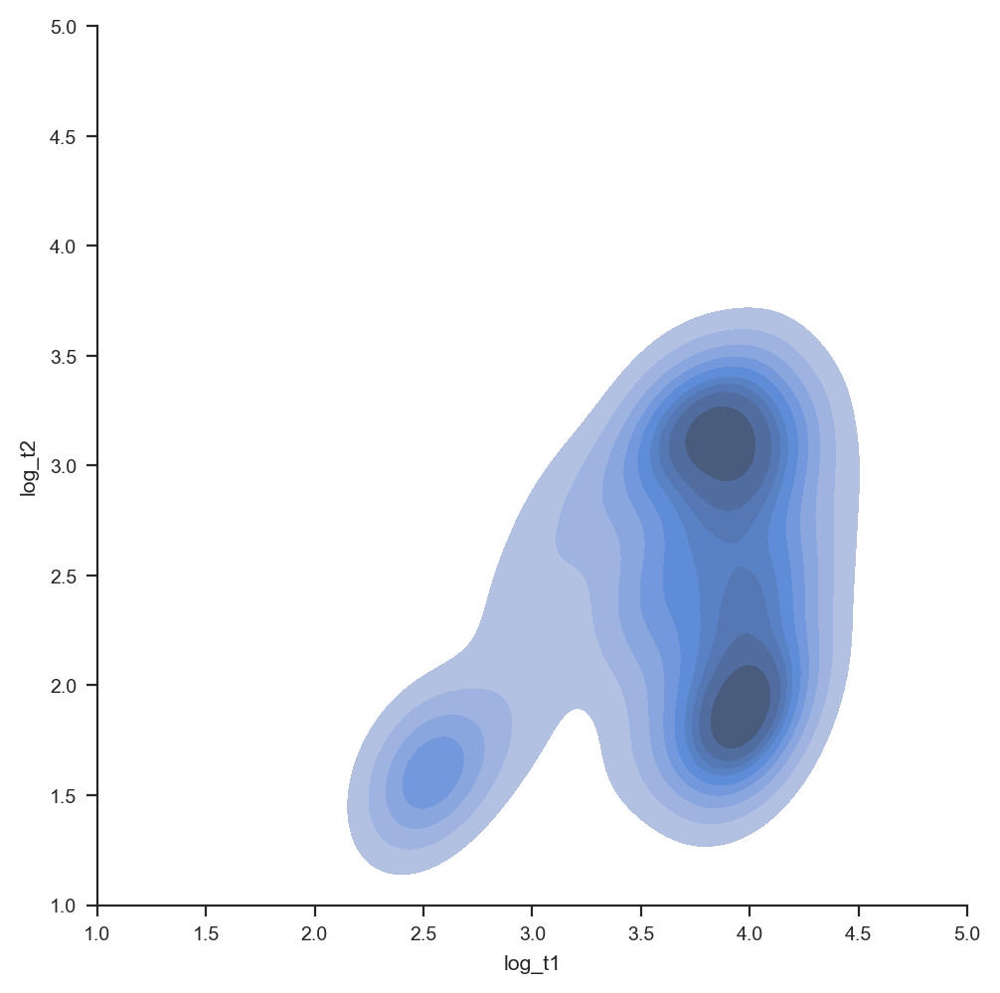

In [121]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=(FutureWarning, SettingWithCopyWarning))

    plot_df = df.loc[(df.stat == 'pos') & (df.p > 2)]
    plot_df['log_t1'] = np.log10(plot_df.t1)
    plot_df['log_t2'] = np.log10(plot_df.t2)
    sns.displot(data=plot_df, x="log_t1", y="log_t2", kind='kde', fill=True) ;
    plt.xlim(1, 5)
    plt.ylim(1, 5)    

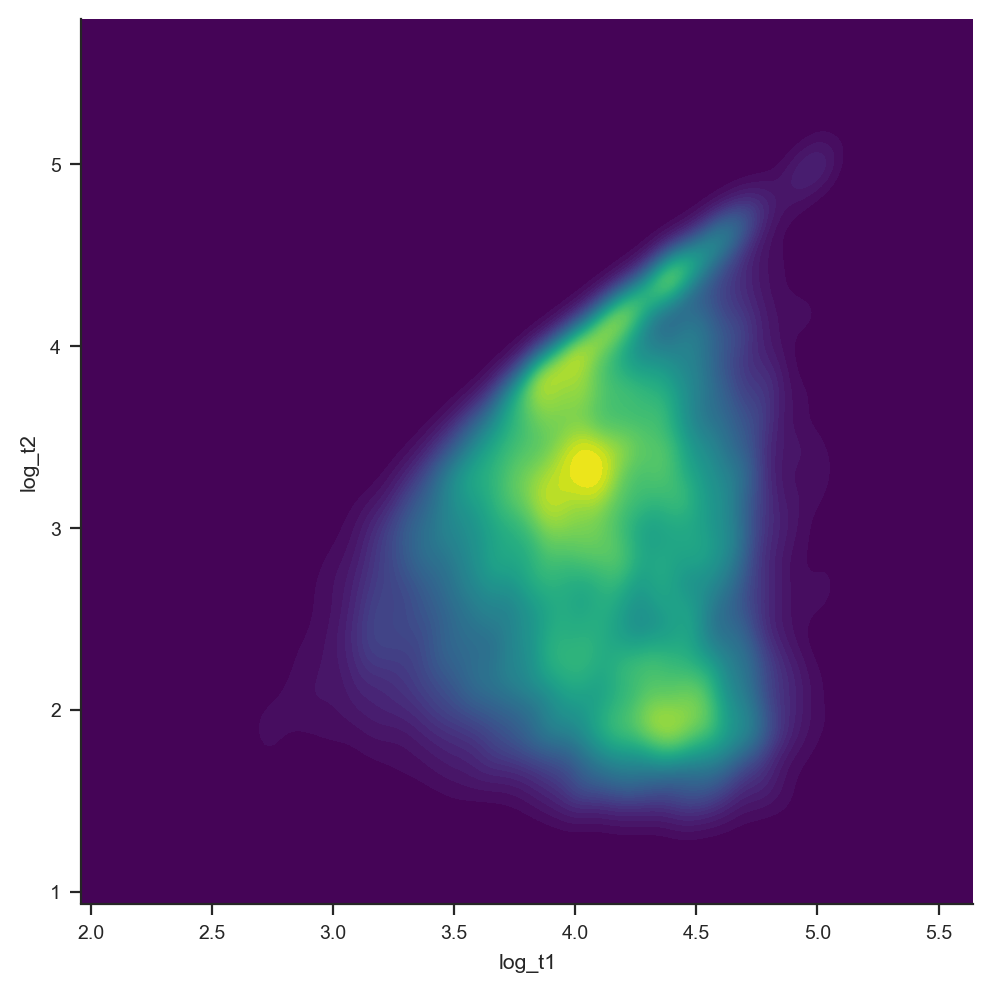

In [135]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)

    # plot_df = df.loc[df.stat == 'comb']
    plot_df = df.loc[df.stat == 'pos']
    plot_df['log_t1'] = np.log10(plot_df.t1)
    plot_df['log_t2'] = np.log10(plot_df.t2)
    sns.displot(data=plot_df, x="log_t1", y="log_t2", kind='kde', fill=True, thresh=0, levels=100, cmap="viridis") ;

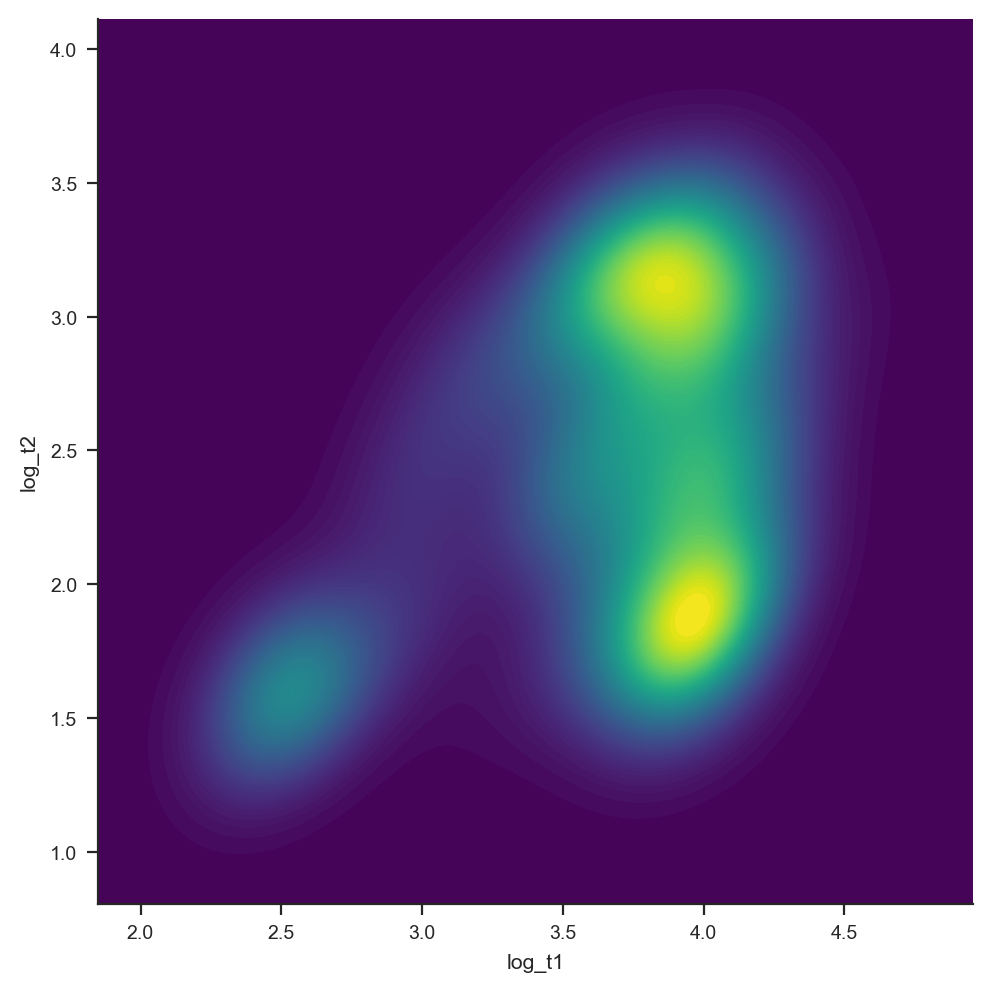

In [138]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)

    plot_df = df.loc[(df.stat == 'pos') & (df.p >= 2)]
    plot_df['log_t1'] = np.log10(plot_df.t1)
    plot_df['log_t2'] = np.log10(plot_df.t2)
    sns.displot(data=plot_df, x="log_t1", y="log_t2", kind='kde', fill=True, thresh=0, levels=100, cmap="viridis") ;
    # plt.xlim(2, 5.5)
    # plt.ylim(1, 5.5)

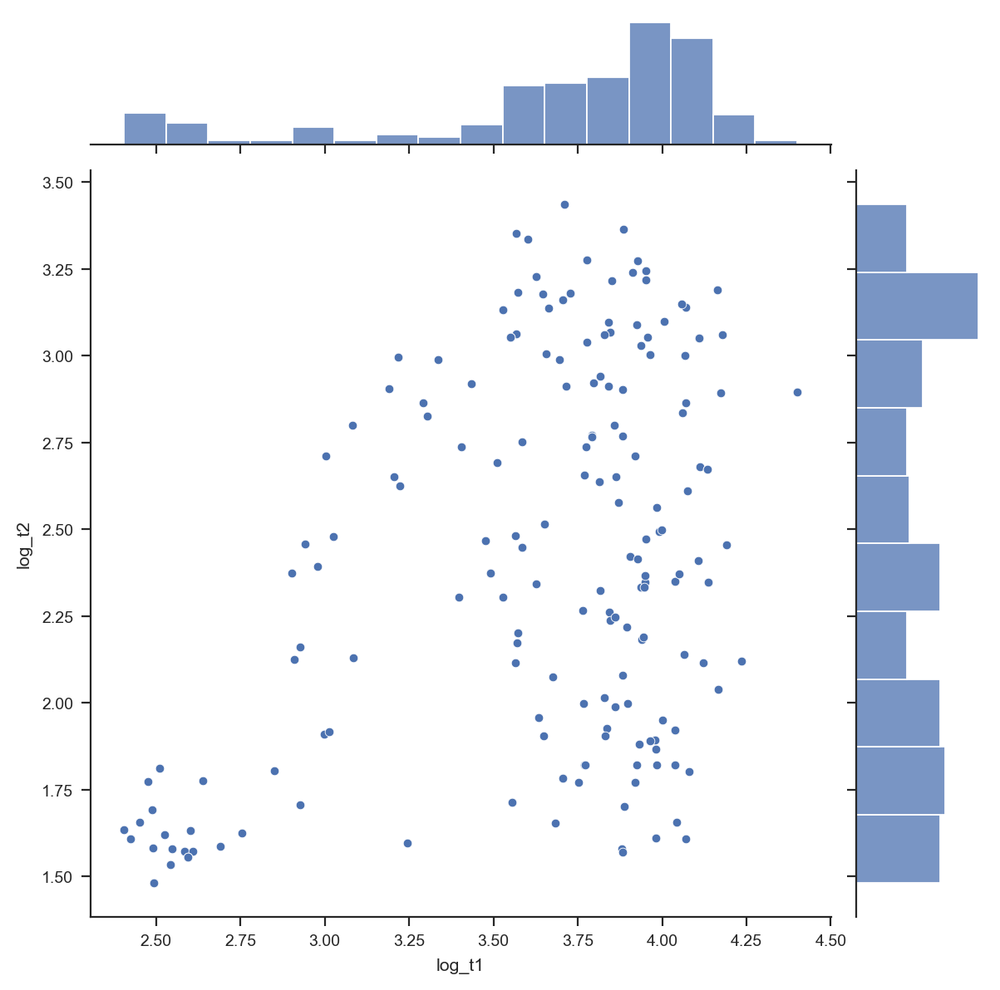

In [43]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)
    
    plot_df = df.loc[(df.stat == 'pos') & (df.p > 2)]
    plot_df['log_t1'] = np.log10(plot_df.t1)
    plot_df['log_t2'] = np.log10(plot_df.t2)
    sns.jointplot(data=plot_df, x="log_t1", y="log_t2") ;

In [217]:
eastern_yellow_scan = pd.read_hdf('../results/Eastern_Yellow_relate_chromhapX.h5')
mikumi_scan = pd.read_hdf('../results/Mikumi_relate_chromhapX.h5')
tanzania_olive_scan = pd.read_hdf('../results/Tanzania_Olive_relate_chromhapX.h5')
ethiopia_live_scan = pd.read_hdf('../results/chromhapX_tskit.h5')

In [218]:
ethiopia_live_scan

,stat,site,p,t1,t2,s,k,fx,kx,fn,N,tree_left,tree_right,clade_left,clade_right,nr_mut,node_id,pos
0,pos,2,1.039089,6117.363281,77.976669,2,9,17,31,18,33,2501401.0,2515636.0,2501401.0,2515636.0,14,92,2501401.0
1,neg,2,0.000000,6117.363281,77.976669,2,9,17,31,18,33,2501401.0,2515636.0,2501401.0,2515636.0,14,92,2501401.0
2,comb,2,1.184362,6117.363281,77.976669,2,9,17,31,18,33,2501401.0,2515636.0,2501401.0,2515636.0,14,92,2501401.0
3,pos,3,0.274724,1936.292603,583.218506,2,14,5,22,7,32,2501401.0,2515636.0,2501401.0,2515636.0,14,89,2501589.0
4,neg,3,0.000000,1936.292603,583.218506,2,14,5,22,7,32,2501401.0,2515636.0,2501401.0,2515636.0,14,89,2501589.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339355,neg,260423,0.000000,4887.211914,2643.381348,2,13,4,20,7,32,143652272.0,143662700.0,143652272.0,143662700.0,14,645625,143652272.0
339356,comb,260423,0.348956,4887.211914,2643.381348,2,13,4,20,7,32,143652272.0,143662700.0,143652272.0,143662700.0,14,645625,143652272.0
339357,pos,260433,0.268629,15394.024414,48.147511,2,3,31,32,32,33,143652272.0,143662700.0,143652272.0,143662700.0,14,645631,143657856.0
339358,neg,260433,0.000000,15394.024414,8604.556641,2,3,8,9,32,33,143652272.0,143662700.0,143652272.0,143662700.0,14,645631,143657856.0


### Manhattan plots

#### Tanzania olives

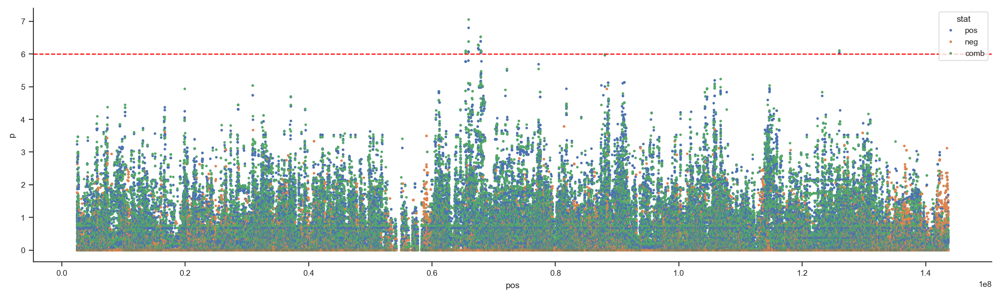

In [226]:
#df = tanzania_olive_scan
#df = df.loc[df.stat == 'neg']

import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=tanzania_olive_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
    sns.despine()
    # plt.xlim((15000000, 25000000))

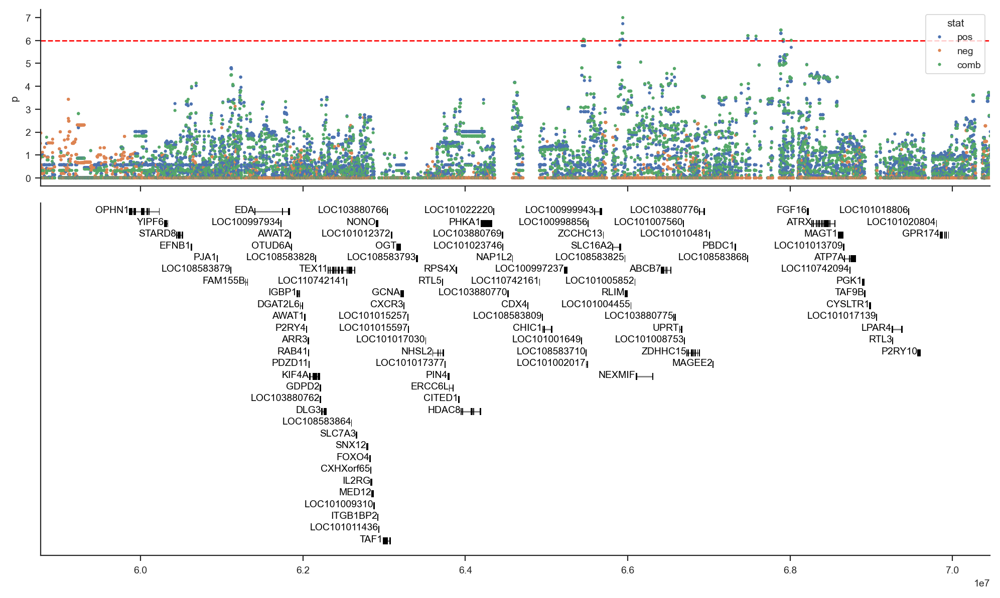

In [46]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 60_000_000, 70_000_000, 'papAnu4', figsize=(10,6), aspect=2)
    sns.scatterplot(data=tanzania_olive_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

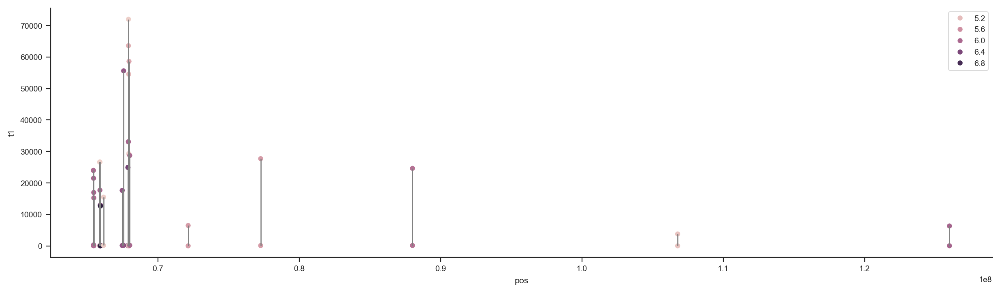

In [47]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)

    plot_df = tanzania_olive_scan.loc[(tanzania_olive_scan.stat == 'comb') & (tanzania_olive_scan.p > 5)]
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=plot_df, x='pos', y='t1', hue='p', ax=ax, linewidth=0, s=20) ;
    sns.scatterplot(data=plot_df, x='pos', y='t2', hue='p', ax=ax, linewidth=0, s=20, legend=False) ;
    ax.vlines(plot_df.pos, ymin=plot_df.t1, ymax=plot_df.t2, color='gray')
    ax.legend(loc='upper right')
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    sns.despine()
    # plt.xlim((15000000, 25000000))

#### Ethiopian olives

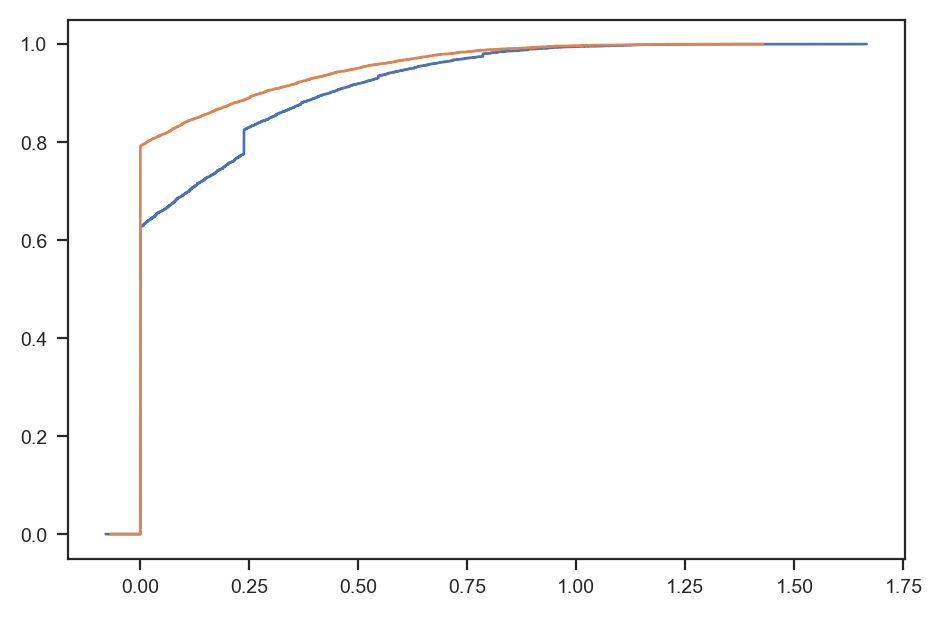

In [250]:
from scipy.stats import ecdf
ecdf(np.log1p(ethiopia_live_scan.loc[lambda df: df.stat == 'pos'].p)).cdf.plot()
ecdf(np.log1p(ethiopia_live_scan.loc[lambda df: df.stat == 'neg'].p)).cdf.plot()

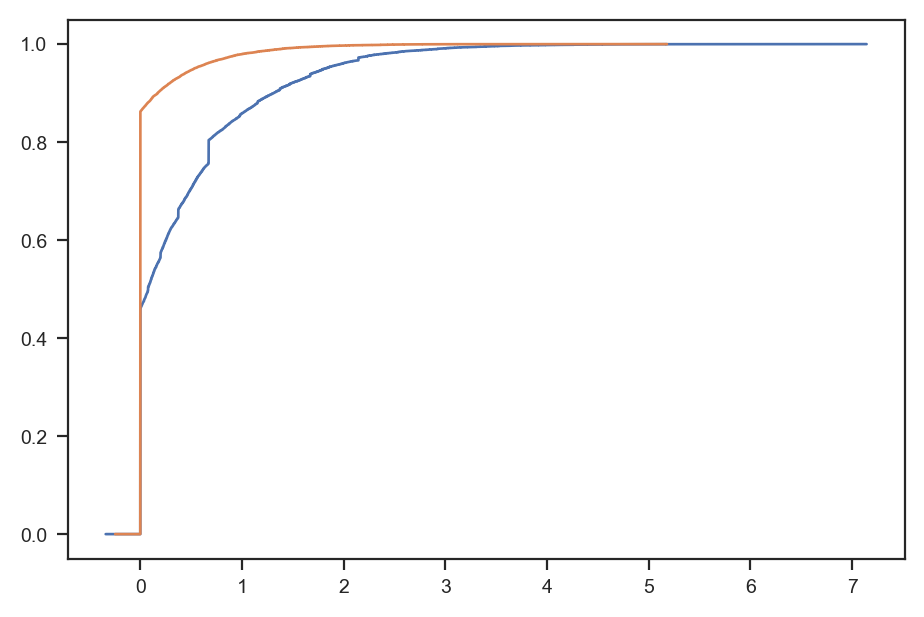

In [245]:
ecdf(tanzania_olive_scan.loc[lambda df: df.stat == 'pos'].p).cdf.plot()
ecdf(tanzania_olive_scan.loc[lambda df: df.stat == 'neg'].p).cdf.plot()

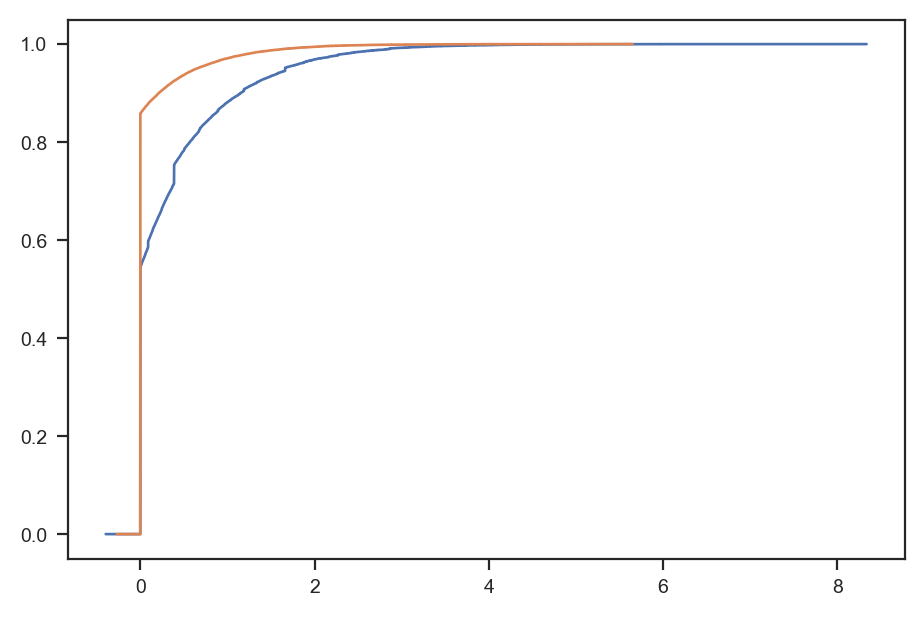

In [248]:
ecdf(eastern_yellow_scan.loc[lambda df: df.stat == 'pos'].p).cdf.plot()
ecdf(eastern_yellow_scan.loc[lambda df: df.stat == 'neg'].p).cdf.plot()

In [235]:
pd.qcut([1, 2], 4)

[(0.999, 1.25], (1.75, 2.0]]
Categories (4, interval[float64, right]): [(0.999, 1.25] < (1.25, 1.5] < (1.5, 1.75] < (1.75, 2.0]]

In [236]:
pd.qcut(ethiopia_live_scan.loc[lambda df: df.stat == 'pos'].p, 4)

ValueError: Bin edges must be unique: array([0.        , 0.        , 0.        , 0.21380544, 3.88538216]).
You can drop duplicate edges by setting the 'duplicates' kwarg

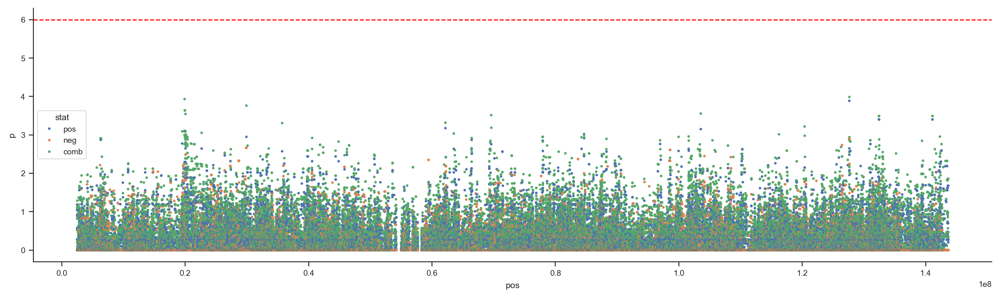

In [221]:
#df = ethiopia_live_scan
#df = df.loc[df.stat == 'neg']

import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=ethiopia_live_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
    sns.despine()
    # plt.xlim((15000000, 25000000))

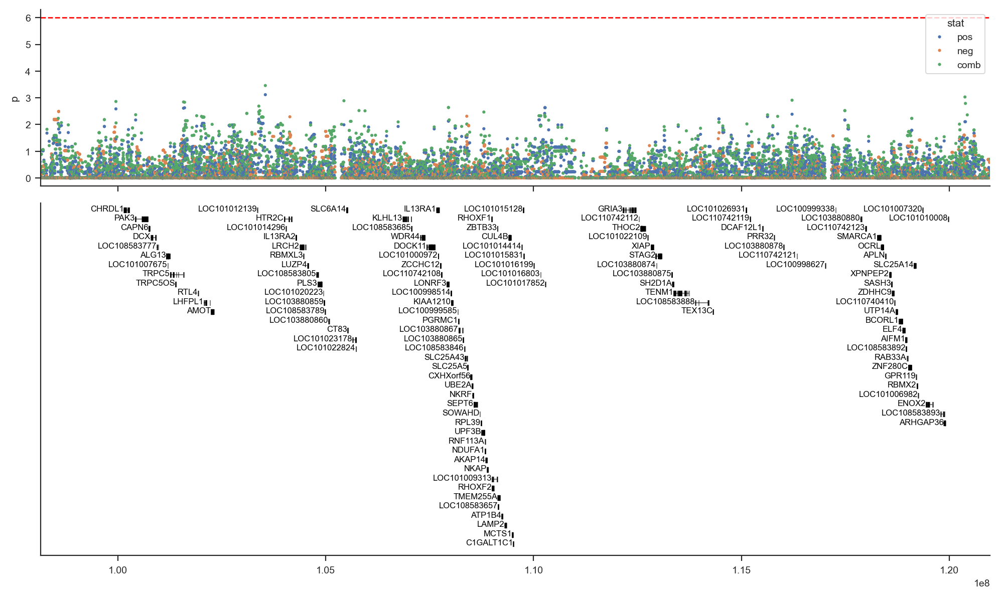

In [49]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 100_000_000, 120_000_000, 'papAnu4', figsize=(10,6), aspect=2)
    sns.scatterplot(data=ethiopia_live_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

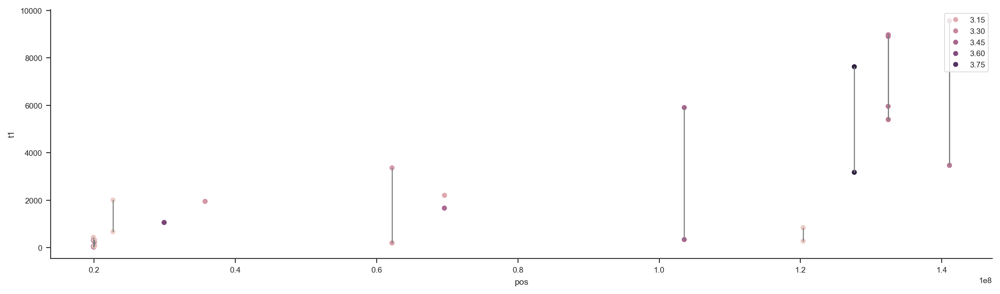

In [50]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)

    plot_df = ethiopia_live_scan.loc[(ethiopia_live_scan.stat == 'comb') & (ethiopia_live_scan.p > 3)]
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=plot_df, x='pos', y='t1', hue='p', ax=ax, linewidth=0, s=20) ;
    sns.scatterplot(data=plot_df, x='pos', y='t2', hue='p', ax=ax, linewidth=0, s=20, legend=False) ;
    ax.vlines(plot_df.pos, ymin=plot_df.t1, ymax=plot_df.t2, color='gray')
    ax.legend(loc='upper right')
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    sns.despine()
    # plt.xlim((15000000, 25000000))

#### Eastern yellows

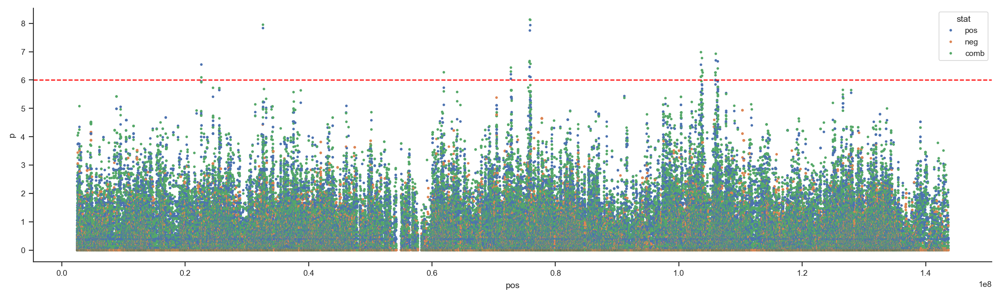

In [51]:
#df = eastern_yellow_scan
#df = df.loc[df.stat == 'neg']

import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=eastern_yellow_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
    sns.despine()
    # plt.xlim((15000000, 25000000))

/var/folders/s6/srs8qkh52w1_h32d65z95tth0000gn/T/ipykernel_99399/2064252587.py:10: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


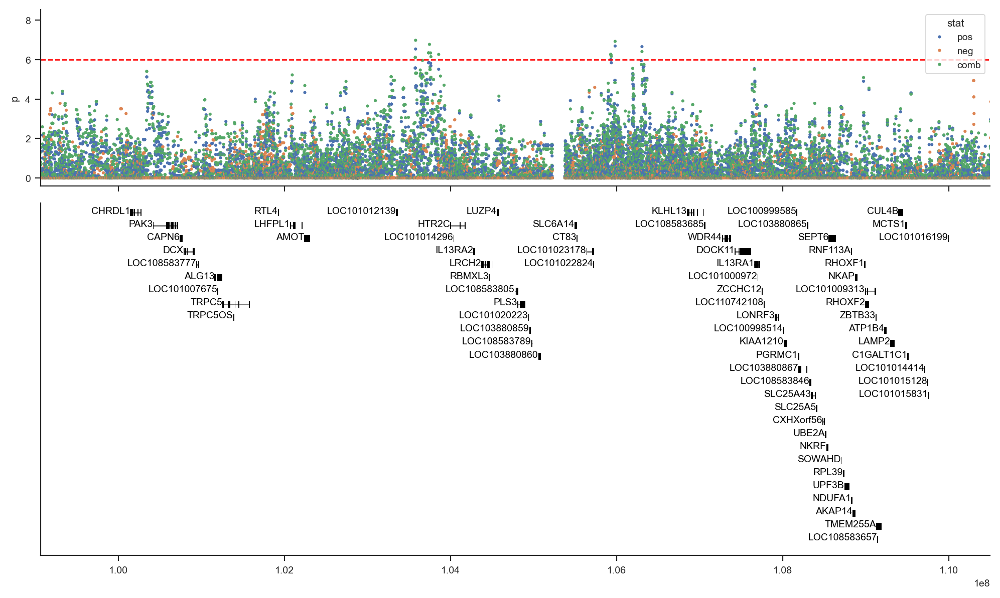

In [52]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 100_000_000, 110_000_000, 'papAnu4', figsize=(10,6), aspect=2)
    sns.scatterplot(data=eastern_yellow_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

/var/folders/s6/srs8qkh52w1_h32d65z95tth0000gn/T/ipykernel_99399/3698927217.py:10: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


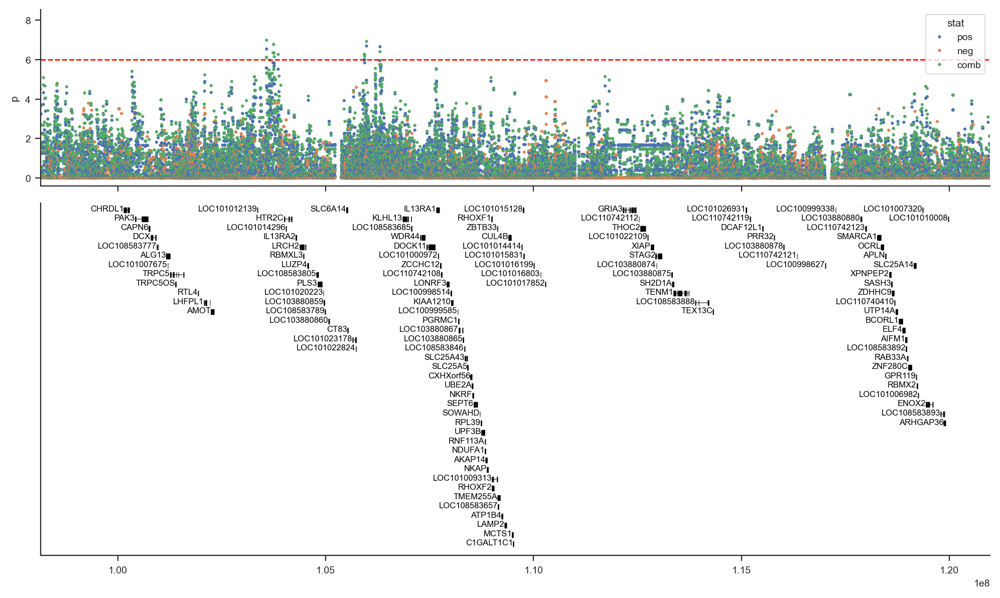

In [53]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 100_000_000, 120_000_000, 'papAnu4', figsize=(10,6), aspect=2)
    sns.scatterplot(data=eastern_yellow_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

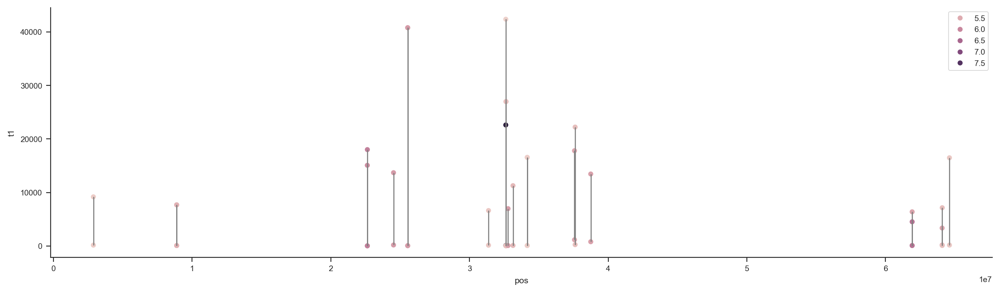

In [54]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)

    plot_df = eastern_yellow_scan.loc[(df.stat == 'comb') & (eastern_yellow_scan.p > 5)]
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=plot_df, x='pos', y='t1', hue='p', ax=ax, linewidth=0, s=20) ;
    sns.scatterplot(data=plot_df, x='pos', y='t2', hue='p', ax=ax, linewidth=0, s=20, legend=False) ;
    ax.vlines(plot_df.pos, ymin=plot_df.t1, ymax=plot_df.t2, color='gray')
    ax.legend(loc='upper right')
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    sns.despine()
    # plt.xlim((15000000, 25000000))

#### Mikumi yellows

/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


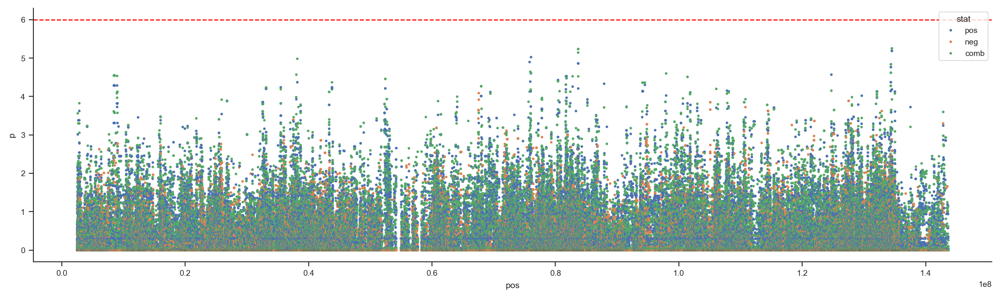

In [55]:
#df = mikumi_scan
#df = df.loc[df.stat == 'neg']

import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=mikumi_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;
    sns.despine()
    # plt.xlim((15000000, 25000000))

/var/folders/s6/srs8qkh52w1_h32d65z95tth0000gn/T/ipykernel_99399/1533669955.py:10: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/kmt/miniconda3/envs/tree-stats/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


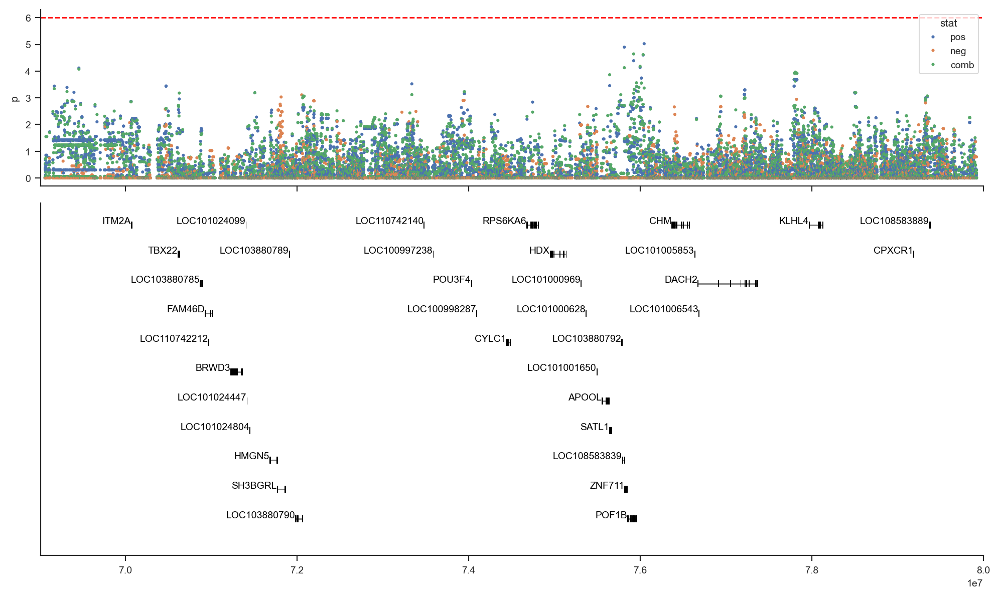

In [56]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 70_000_000, 80_000_000, 'papAnu4', figsize=(10,6), aspect=2)
    sns.scatterplot(data=mikumi_scan, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8*3100/156), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

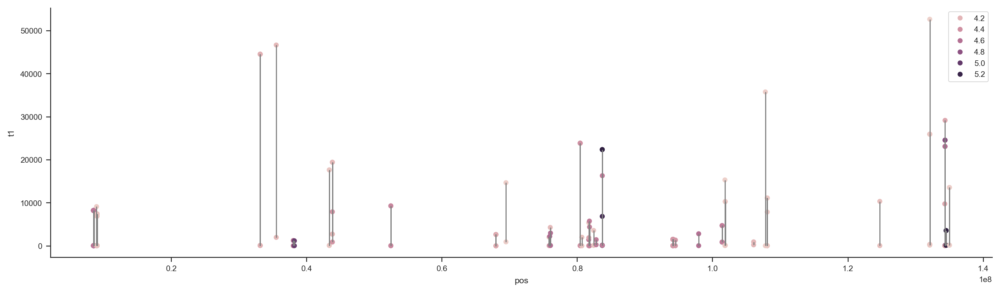

In [57]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)

    plot_df = mikumi_scan.loc[(mikumi_scan.stat == 'comb') & (mikumi_scan.p > 4)]
    
    fig, ax = plt.subplots(1, 1, figsize=(15,4))
    sns.scatterplot(data=plot_df, x='pos', y='t1', hue='p', ax=ax, linewidth=0, s=20) ;
    sns.scatterplot(data=plot_df, x='pos', y='t2', hue='p', ax=ax, linewidth=0, s=20, legend=False) ;
    ax.vlines(plot_df.pos, ymin=plot_df.t1, ymax=plot_df.t2, color='gray')
    ax.legend(loc='upper right')
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    sns.despine()
    # plt.xlim((15000000, 25000000))

### Gene plots

ProxyError: HTTPSConnectionPool(host='api.genome.ucsc.edu', port=443): Max retries exceeded with url: /getData/track (Caused by ProxyError('Unable to connect to proxy', NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x29342bd00>: Failed to resolve 'proxy-default' ([Errno 8] nodename nor servname provided, or not known)")))

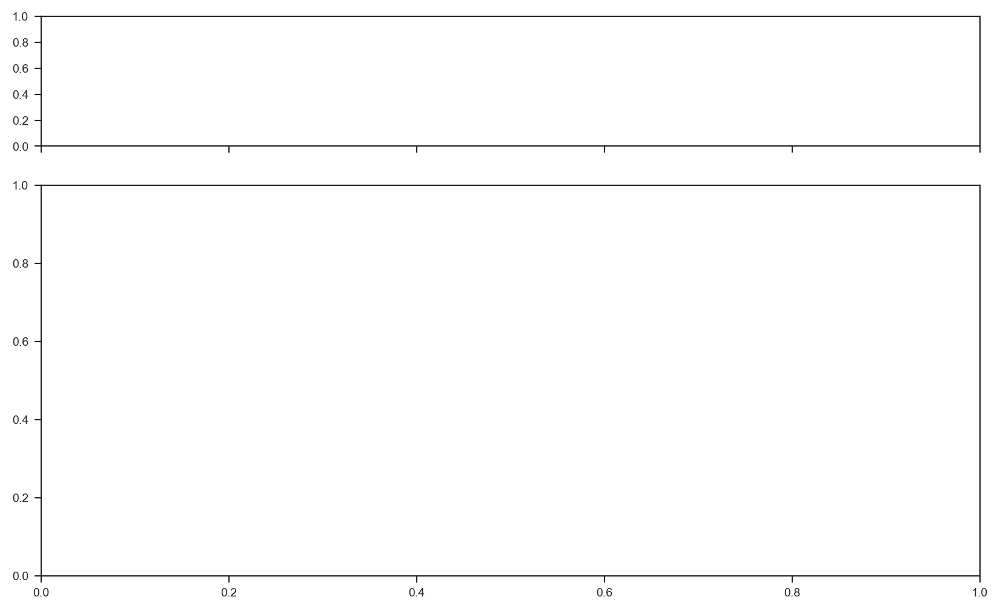

In [56]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 0, 20_000_000, 'papAnu4', figsize=(10,6), aspect=3)
    sns.scatterplot(data=df, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 20_000_000, 40_000_000, 'papAnu4', figsize=(10,6), aspect=3)
    sns.scatterplot(data=df, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 60_000_000, 80_000_000, 'papAnu4', figsize=(10,6), aspect=3)
    sns.scatterplot(data=df, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

ProxyError: HTTPSConnectionPool(host='api.genome.ucsc.edu', port=443): Max retries exceeded with url: /getData/track (Caused by ProxyError('Unable to connect to proxy', NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x16bedcdf0>: Failed to resolve 'proxy-default' ([Errno 8] nodename nor servname provided, or not known)")))

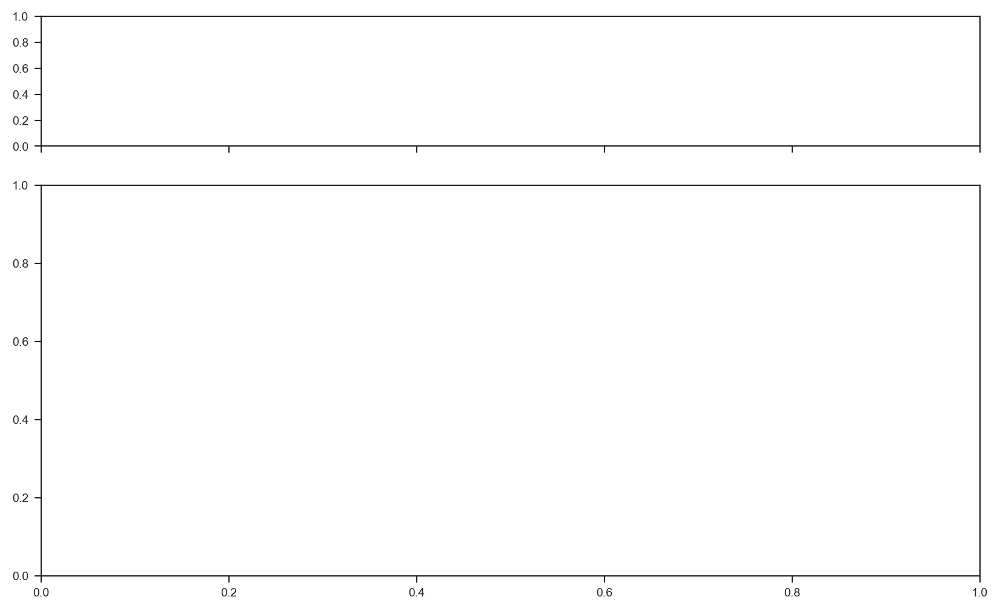

In [57]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 80_000_000, 100_000_000, 'papAnu4', figsize=(10,6), aspect=3)
    sns.scatterplot(data=df, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 100_000_000, 120_000_000, 'papAnu4', figsize=(10,6), aspect=3)
    sns.scatterplot(data=df, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 120_000_000, 140_000_000, 'papAnu4', figsize=(10,6), aspect=3)
    sns.scatterplot(data=df, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    ax = gi.gene_plot('chrX', 140_000_000, 155_000_000, 'papAnu4', figsize=(10,6), aspect=3)
    sns.scatterplot(data=df, x='pos', y='p', hue='stat', ax=ax, linewidth=0, s=5) ;
    # ax.set_xticks(np.arange(0, max(df.pos)+1, 10000000))
    ax.axhline(-np.log10(5e-8), color='red', linestyle='dashed') ;

    plt.tight_layout()
    sns.despine()